                                                     ALZHEIMER'S DISEASE





#Research paper

##Objective

 The objectives of the study were to investigate the relationships between
 social networks, dementia severity, cognitive function, and adverse events in individuals
 with mild-to-moderate Alzheimer's disease

##Methods

 The study analyzed data from the NILVAD study, which included 464
 participants with mild-to-moderate Alzheimer's disease. The participants' social
 networks were assessed using the Lubben Social Network Scale (LSNS), while their
 cognitive function was assessed using the Alzheimer's disease Assessment Scale
 (ADAS-Cog). Dementia severity was assessed using the Clinical Dementia Rating, Sum
 of Boxes (CDR-Sb)

##Results

 The study found that a poor social network was significantly associated with
 greater dementia severity, but not with greater cognitive impairment. Additionally, a
 greater baseline dementia severity predicted a decline in social networks over 18
 months. Furthermore, a poor social network was associated with a significantly
 increased likelihood of experiencing serious adverse events.


 The study's findings suggest that as dementia progresses, older adults with Alzheimer's
 disease are more likely to experience a decline in social networks. This decline in social
 networks is associated with a greater likelihood of experiencing serious adverse events.
 The study's results add novel insight into the complex relationship between social
 networks, dementia progression, and adverse events in Alzheimer's disease, and
 underscore the importance of developing and maintaining social networks in
 Alzheimer's disease.

___________________________________________________________________________________________________

#Import Libraries & Dataset


pandas is used for data manipulation, providing structures like DataFrame to handle tabular data efficiently. networkx allows for the creation and analysis of social networks as graphs, helping to study connections between individuals. matplotlib.pyplot is a plotting library used to visualize data, including network graphs. seaborn, built on matplotlib, is used to create visually appealing statistical plots. numpy supports numerical operations and array handling, essential for efficient computations. Together, these libraries enable robust analysis and visualization of complex social network data.

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

loading the alzheimer's disease dataset


In [ ]:
df = pd.read_csv("/content/alzheimers_disease_data - alzheimers_disease_data.csv")

# Dataset Basic Analysis


###Getting to know about variables

 a concise summary of the DataFrame

In [ ]:
print(len(df))
df.head()

2149


,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,DoctorInCharge
0,4751,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,...,0,0,1.725883,0,0,0,1,0,0,XXXConfid
1,4752,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,...,0,0,2.592424,0,0,0,0,1,0,XXXConfid
2,4753,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,...,0,0,7.119548,0,1,0,1,0,0,XXXConfid
3,4754,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,...,0,1,6.481226,0,0,0,0,0,0,XXXConfid
4,4755,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,...,0,0,0.014691,0,0,1,1,0,0,XXXConfid


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2149 entries, 0 to 2148
Data columns (total 35 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   PatientID                  2149 non-null   int64  
 1   Age                        2149 non-null   int64  
 2   Gender                     2149 non-null   int64  
 3   Ethnicity                  2149 non-null   int64  
 4   EducationLevel             2149 non-null   int64  
 5   BMI                        2149 non-null   float64
 6   Smoking                    2149 non-null   int64  
 7   AlcoholConsumption         2149 non-null   float64
 8   PhysicalActivity           2149 non-null   float64
 9   DietQuality                2149 non-null   float64
 10  SleepQuality               2149 non-null   float64
 11  FamilyHistoryAlzheimers    2149 non-null   int64  
 12  CardiovascularDisease      2149 non-null   int64  
 13  Diabetes                   2149 non-null   int64

###Datatypes

the data types of each column in the DataFrame

In [ ]:
df.dtypes

,0
PatientID,int64
Age,int64
Gender,int64
Ethnicity,int64
EducationLevel,int64
BMI,float64
Smoking,int64
AlcoholConsumption,float64
PhysicalActivity,float64
DietQuality,float64


###Numeric features

This code snippet is designed to identify and display the numeric features  in the DataFrame. It uses the select_dtypes function to filter out columns that have numeric data types (integers or floats). The first line calculates and prints the total number of numeric columns by applying the len() function to the selected columns. A separator is printed for clarity, followed by the names of the numeric columns. This is useful for quickly identifying numerical features in the dataset, which can be crucial for tasks like feature selection, data analysis, and model building.

In [ ]:
print(f"Number of Numeric Features: {len(df.select_dtypes(include=['int', 'float']).columns)}")
print("-"*50)
print(f"Numeric Feature's Name: \n{df.select_dtypes(include=['int', 'float']).columns}")

Number of Numeric Features: 34
--------------------------------------------------
Numeric Feature's Name: 
Index(['PatientID', 'Age', 'Gender', 'Ethnicity', 'EducationLevel', 'BMI',
       'Smoking', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality',
       'SleepQuality', 'FamilyHistoryAlzheimers', 'CardiovascularDisease',
       'Diabetes', 'Depression', 'HeadInjury', 'Hypertension', 'SystolicBP',
       'DiastolicBP', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL',
       'CholesterolTriglycerides', 'MMSE', 'FunctionalAssessment',
       'MemoryComplaints', 'BehavioralProblems', 'ADL', 'Confusion',
       'Disorientation', 'PersonalityChanges', 'DifficultyCompletingTasks',
       'Forgetfulness', 'Diagnosis'],
      dtype='object')


###Categorical features

 displays categorical features in a pandas DataFrame by filtering columns with a data type of object, which typically represents text or categorical data. It calculates and prints the total number of these columns and lists their names, helping to understand the dataset's structure and identify variables for encoding or feature engineering.








In [ ]:
print(f"Number of Categorical Features: {len(df.select_dtypes(include=['object']).columns)}")
print("-"*50)
print(f"Categorical Feature's Name: \n{df.select_dtypes(include=['object']).columns}")

Number of Categorical Features: 1
--------------------------------------------------
Categorical Feature's Name: 
Index(['DoctorInCharge'], dtype='object')


 to count the number of unique values in each column of a DataFrame

In [ ]:
df.nunique()

,0
PatientID,2149
Age,31
Gender,2
Ethnicity,4
EducationLevel,4
BMI,2149
Smoking,2
AlcoholConsumption,2149
PhysicalActivity,2149
DietQuality,2149


###Missing values and duplicates

Calculates the total number of missing values in each column .
Helps to identify which features may require data cleaning before analysis.

In [ ]:
df.isnull().sum()

,0
PatientID,0
Age,0
Gender,0
Ethnicity,0
EducationLevel,0
BMI,0
Smoking,0
AlcoholConsumption,0
PhysicalActivity,0
DietQuality,0


 Counts the number of duplicate rows in the DataFrame. Understanding the presence of duplicates is crucial for ensuring data integrity and avoiding biased analysis.

In [ ]:
df.duplicated().sum()


0

###Statistical analysis

This generates descriptive statistics for numerical columns in the DataFrame, including count, mean, standard deviation, min, max, and quartiles. The T method transposes the output for easier readability, offering insights into the distribution and central tendency of the numeric features.

In [ ]:
df.describe().T


,count,mean,std,min,25%,50%,75%,max
PatientID,2149.0,5825.000000,620.507185,4751.000000,5288.000000,5825.000000,6362.000000,6899.000000
Age,2149.0,74.908795,8.990221,60.000000,67.000000,75.000000,83.000000,90.000000
Gender,2149.0,0.506282,0.500077,0.000000,0.000000,1.000000,1.000000,1.000000
Ethnicity,2149.0,0.697534,0.996128,0.000000,0.000000,0.000000,1.000000,3.000000
EducationLevel,2149.0,1.286645,0.904527,0.000000,1.000000,1.000000,2.000000,3.000000
BMI,2149.0,27.655697,7.217438,15.008851,21.611408,27.823924,33.869778,39.992767
Smoking,2149.0,0.288506,0.453173,0.000000,0.000000,0.000000,1.000000,1.000000
AlcoholConsumption,2149.0,10.039442,5.757910,0.002003,5.139810,9.934412,15.157931,19.989293
PhysicalActivity,2149.0,4.920202,2.857191,0.003616,2.570626,4.766424,7.427899,9.987429
DietQuality,2149.0,4.993138,2.909055,0.009385,2.458455,5.076087,7.558625,9.998346


Inference

PatientID: Patient IDs range from 4751 to 6900.

Age: Patients are aged between 60 and 90, with an average of 75 years.

Gender: Nearly equal distribution between males and females.

Ethnicity: Most patients are Caucasian, with a few African American,

Asian, and other ethnicities.

EducationLevel: Most patients have a high school or bachelor's degree.

BMI: Ranges from 15 to 40, with an average of 27.7.

Smoking & AlcoholConsumption: About 29% smoke; alcohol consumption
averages 10 units/week.

PhysicalActivity & DietQuality: Patients average about 5 hours of activity and a diet quality score of 5.

SleepQuality: Average sleep quality score is 7.

Medical History: Family history of Alzheimer's (~25%), cardiovascular
disease ~14%, diabetes (~15%), depression (~20%), head injury (~9%),
hypertension (~15%).

Blood Pressure & Cholesterol: Average systolic BP is 134 mmHg, diastolic BP is 90 mmHg, total cholesterol is 225 mg/dL.
Cognitive/Functional Assessments: MMSE average is 15; functional assessment averages 5.

Symptoms: Confusion (~20%), memory complaints (~21%), and forgetfulness (~30%) are reported.
Diagnosis: About 35% of patients are diagnosed with Alzheimer's.

###Analyze On Diagnosis


###Group by 'Diagnosis' and get the mean for all columns


The code snippet calculates the mean statistics of numeric features in the DataFrame df, grouped by the unique values in the "Diagnosis" column, using the groupby and mean(numeric_only=True) functions. It then exports the resulting DataFrame to a CSV file named "stats-by-diagnosis.csv" for easy sharing and further analysis of the characteristics of different diagnostic groups.

In [ ]:
mean_stats = df.groupby('Diagnosis').mean(numeric_only=True)
mean_stats.to_csv("stats-by-diagnosis.csv")


This code snippet summarizes the average values of numeric features in the DataFrame df by grouping them according to the "Diagnosis" column, facilitating insights into how different diagnoses affect these features. By exporting the results to "stats-by-diagnosis.csv," it allows for streamlined sharing and further analysis, enhancing understanding of diagnostic group characteristics.

In [ ]:
# Select only numeric columns
numeric_cols = df.select_dtypes(include=['number'])

# Perform the aggregation
mean_stats = df.groupby('Diagnosis')[numeric_cols.columns].agg(['mean'])

# Transpose the result if needed
mean_stats_transposed = mean_stats.T

print(mean_stats_transposed)


Diagnosis                                 0            1
PatientID                 mean  5806.177106  5859.401316
Age                       mean    74.945284    74.842105
Gender                    mean     0.514039     0.492105
Ethnicity                 mean     0.708423     0.677632
EducationLevel            mean     1.316055     1.232895
BMI                       mean    27.515092    27.912670
Smoking                   mean     0.290137     0.285526
AlcoholConsumption        mean    10.071880     9.980156
PhysicalActivity          mean     4.907640     4.943160
DietQuality               mean     4.974839     5.026581
SleepQuality              mean     7.124832     6.916292
FamilyHistoryAlzheimers   mean     0.262779     0.232895
CardiovascularDisease     mean     0.136069     0.159211
Diabetes                  mean     0.159107     0.135526
Depression                mean     0.202304     0.197368
HeadInjury                mean     0.097192     0.084211
Hypertension              mean 

#EDA

The code snippet defines a list of categorical features relevant to a dataset and extracts the numeric features by excluding these from the DataFrame df's columns. It then prints the count of numeric features and categorical features, highlighting the dataset's composition, which is essential for understanding the types of analyses that can be performed. This distinction helps in selecting appropriate statistical methods and visualizations based on the data types.

In [ ]:
categorical_features = ['Gender', 'Ethnicity', 'EducationLevel', 'Smoking',
'PhysicalActivity', 'DietQuality', 'SleepQuality', 'FamilyHistoryAlzheimers', 'CardiovascularDisease',
'Diabetes', 'Depression', 'HeadInjury', 'Hypertension',
'MemoryComplaints', 'BehavioralProblems', 'ADL', 'Confusion', 'Disorientation',
'PersonalityChanges', 'DifficultyCompletingTasks', 'Forgetfulness', 'Diagnosis']

In [ ]:
numeric_features = [col for col in df.columns if col not in categorical_features]

In [ ]:
print(f"Numeric Features: {len(numeric_features)}")
print("-"*50)
print(f"Categorical Features: {len(categorical_features)}")

Numeric Features: 13
--------------------------------------------------
Categorical Features: 22


##Barplot

The countplot function generates count plots for specified categorical variables in the DataFrame df, using Seaborn to visualize the frequency of each category. It customizes the plot's appearance with a dark grid style and adds titles and labels for clarity. By calling this function for various categorical features, the code provides a comprehensive visual overview of the distribution of these variables, aiding in understanding the dataset's demographic and health-related characteristics. This visualization is crucial for identifying patterns, trends, and potential areas for further analysis.

In [ ]:
def countplot(col):
    plt.figure(figsize=(6, 5))
    sns.set_style("darkgrid")

    sns.countplot(data=df, x=col, hue=col, palette='dark', width=0.5)

    plt.title(f"{col}'s Countplot", fontsize=14, weight="bold")
    plt.xlabel(col, fontsize=10)
    plt.ylabel("Count", fontsize=10)

    plt.legend(title=col, loc='upper right')

    plt.show()


Gender: Gender of the patients, where 0 represents Male and 1 represents Female.

Ethnicity: The ethnicity of the patients, coded as follows:
0: Caucasian
1: African American
2: Asian
3: Other

EducationLevel: The education level of the patients, coded as follows:
0: None
1: High School
2: Bachelor's
3: Higher

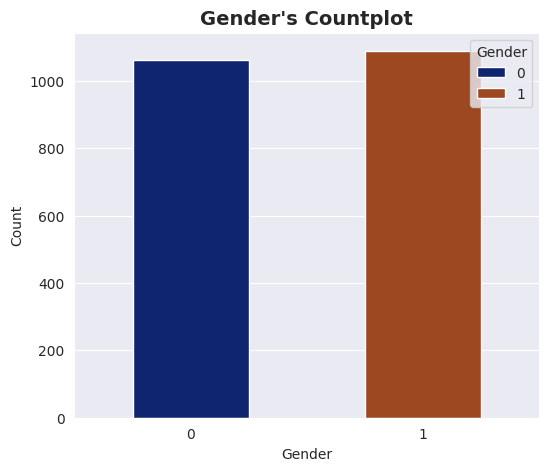

In [ ]:
countplot("Gender")

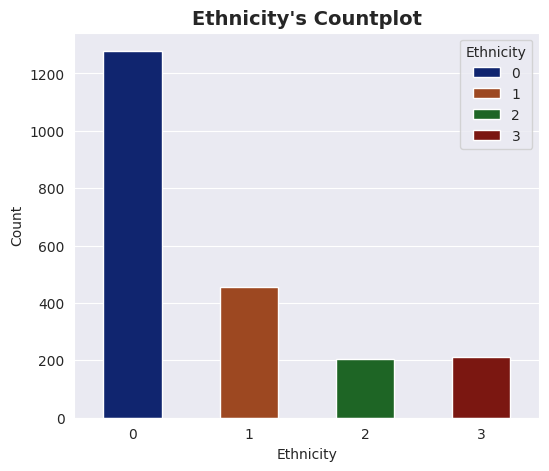

In [ ]:
countplot("Ethnicity")


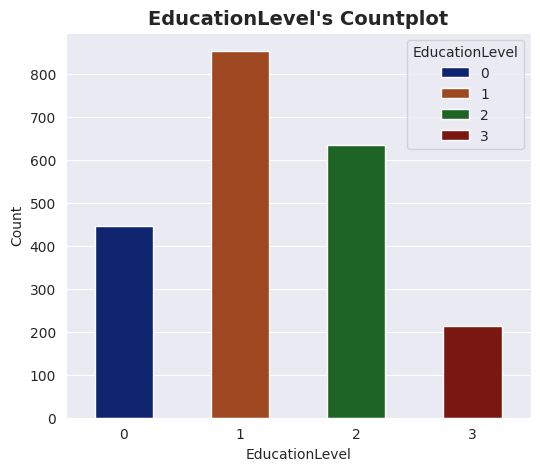

In [ ]:
countplot("EducationLevel")


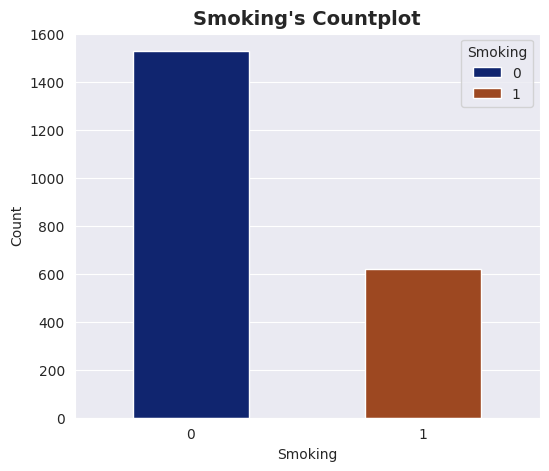

In [ ]:
countplot("Smoking")


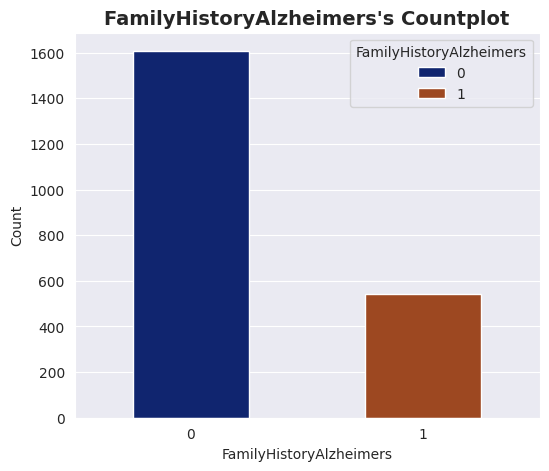

In [ ]:
countplot("FamilyHistoryAlzheimers")


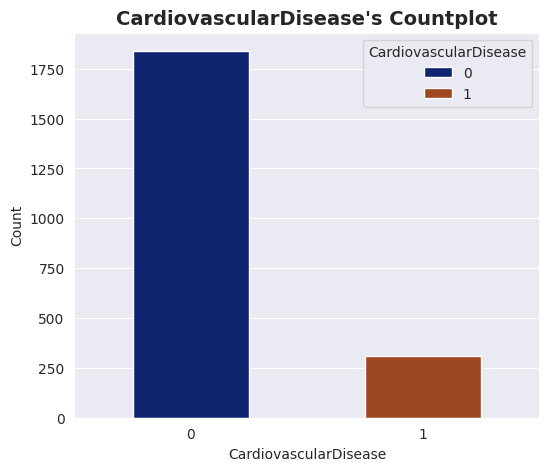

In [ ]:
countplot("CardiovascularDisease")


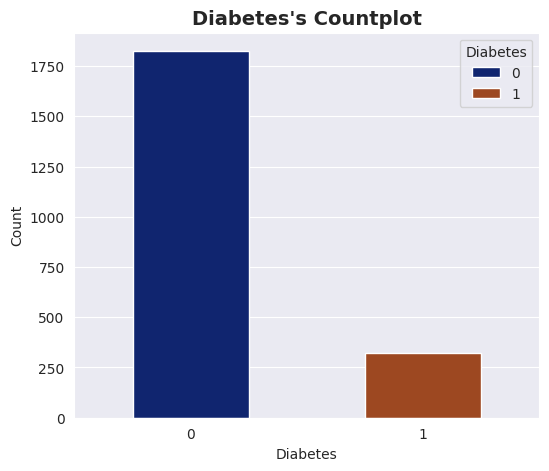

In [ ]:
countplot("Diabetes")


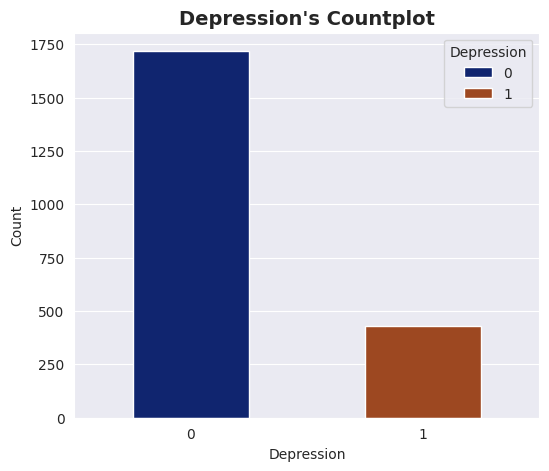

In [ ]:
countplot("Depression")

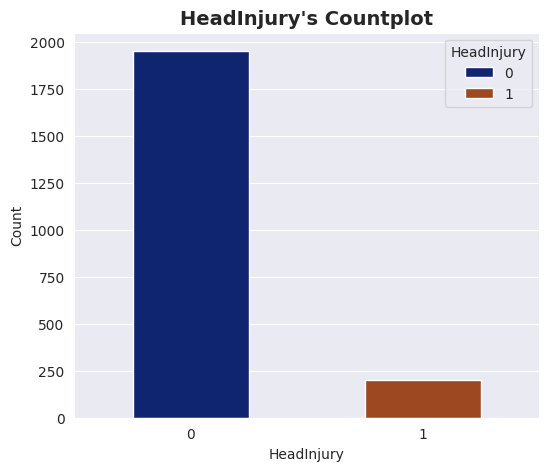

In [ ]:
countplot("HeadInjury")


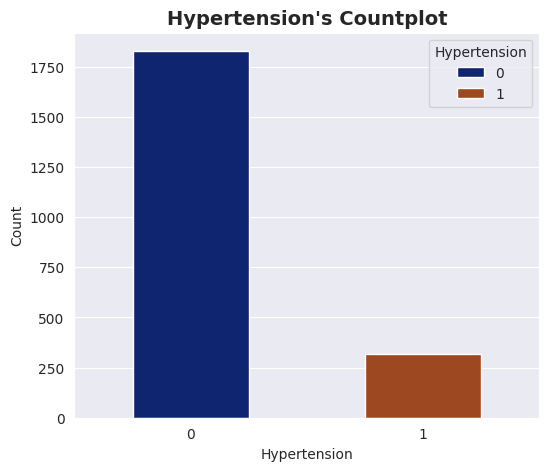

In [ ]:
countplot("Hypertension")

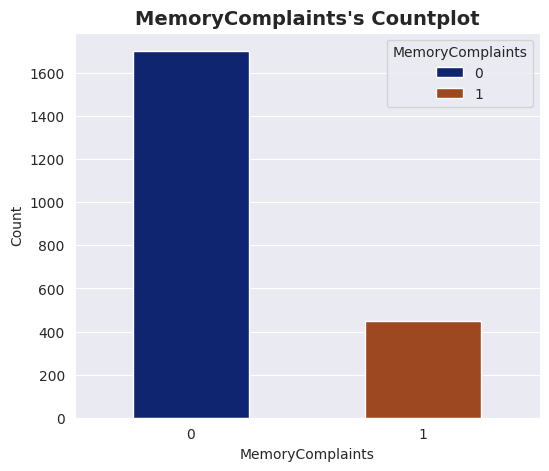

In [ ]:
countplot("MemoryComplaints")

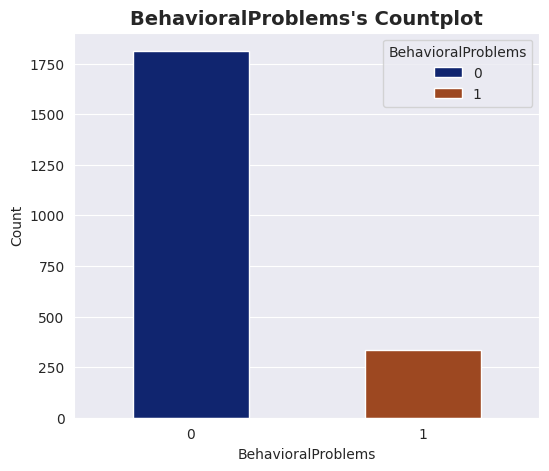

In [ ]:
countplot("BehavioralProblems")

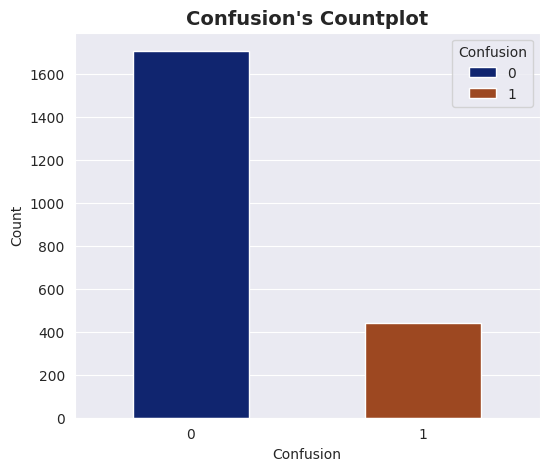

In [ ]:
countplot("Confusion")

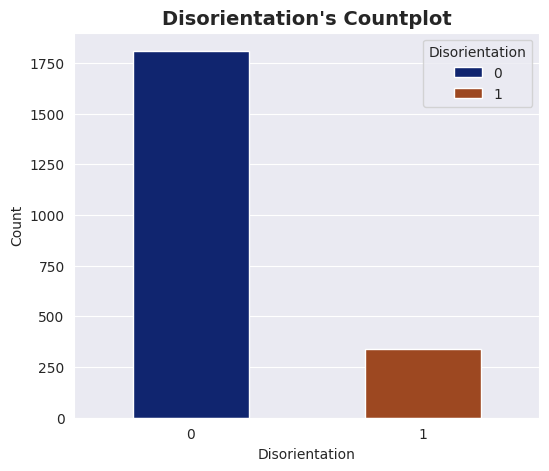

In [ ]:
countplot("Disorientation")

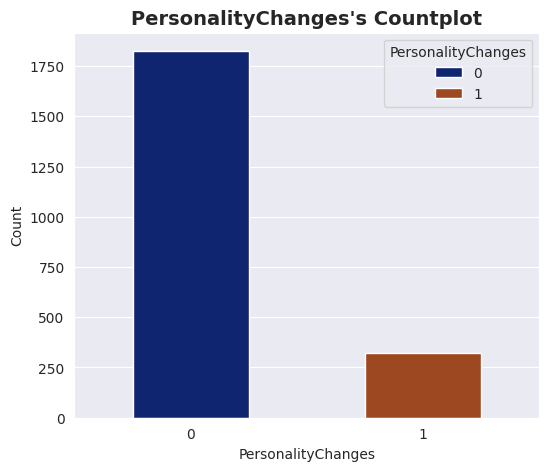

In [ ]:
countplot("PersonalityChanges")

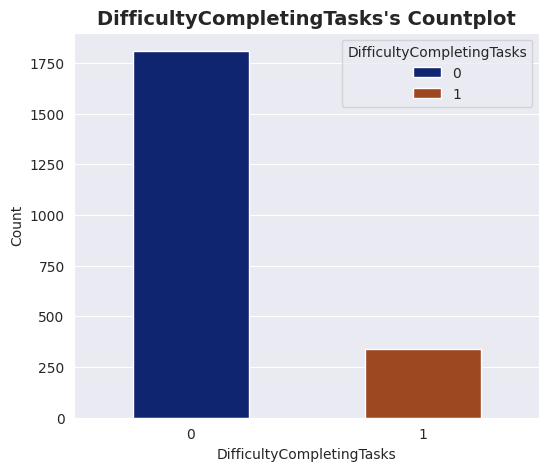

In [ ]:
countplot("DifficultyCompletingTasks")

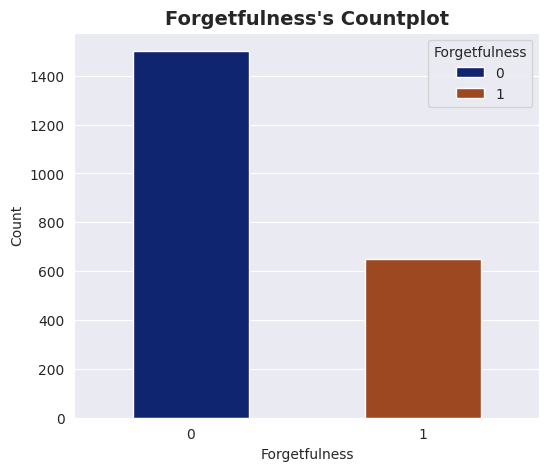

In [ ]:
countplot("Forgetfulness")

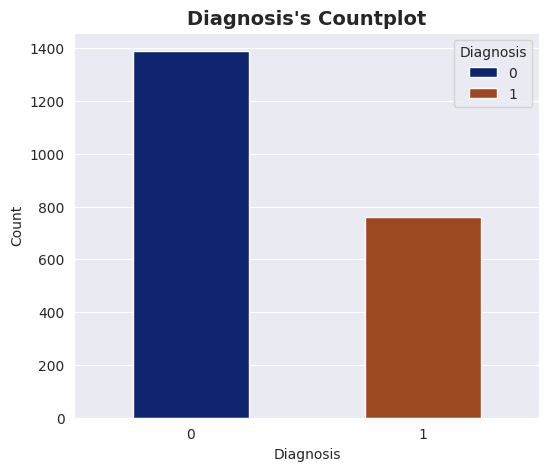

In [ ]:
countplot("Diagnosis")

##Distributions

this generates histograms for the numeric features

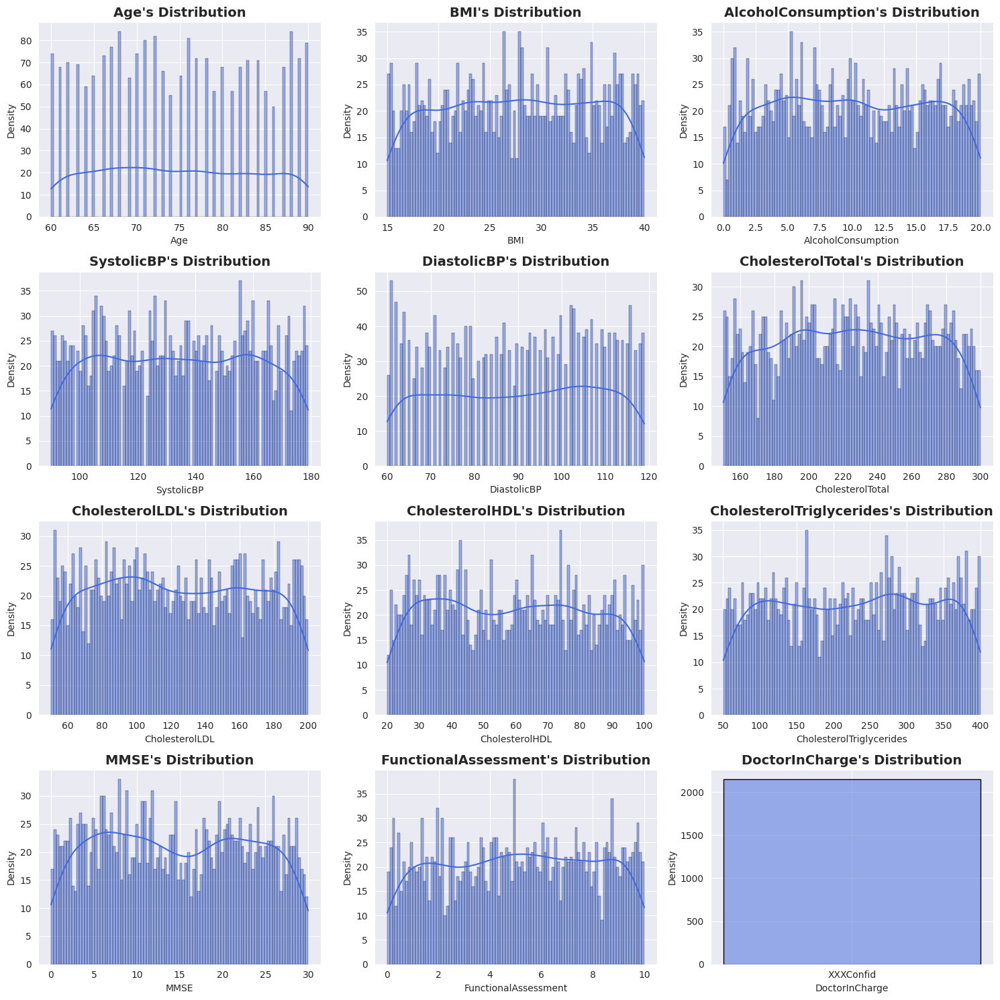

In [ ]:
plt.figure(figsize=(15, 15))
sns.set_style('darkgrid')
for i, var in enumerate(numeric_features[1:], 1):
    plt.subplot(4, 3, i)
    sns.histplot(df[var],
                 bins=100,
                 kde=True,
                 color='royalblue',
                 edgecolor='black')
    plt.title(f"{var}'s Distribution",
              fontsize=14,
              weight="bold")
    plt.xlabel(var, fontsize=10)
    plt.ylabel("Density", fontsize=10)
plt.tight_layout()
plt.show()


1. **Age Distribution**: The distribution of ages is relatively uniform across the older adult age range (60-90), suggesting a diverse sample of patients without a clear age bias.

2. **BMI and Alcohol Consumption**: The BMI and alcohol consumption distributions show varying levels of density, indicating some common BMI ranges and alcohol consumption levels among the patients. The peaks suggest certain BMI values may be more prevalent.

3. **Blood Pressure Measurements**: The distributions for systolic and diastolic blood pressure indicate that there may be patients with higher blood pressure readings, which is critical since hypertension is a risk factor for cognitive decline.

4. **Cholesterol Levels**: The cholesterol levels (total, HDL, LDL, and triglycerides) exhibit some peaks and variances. Monitoring these levels is essential for assessing cardiovascular health, which can influence Alzheimer’s progression.

5. **Cognitive Assessment (MMSE)**: The MMSE scores show a concentration around certain values, indicating varying cognitive statuses among patients. This may reflect the progression of the disease.

6. **Functional Assessment**: The functional assessment scores appear to have a significant spread, suggesting that the patients experience different levels of functional impairment.

7. **Doctor In Charge**: The last plot appears to be empty, indicating that there may be a lack of variance in this categorical variable or an issue in the dataset.



##Boxplot

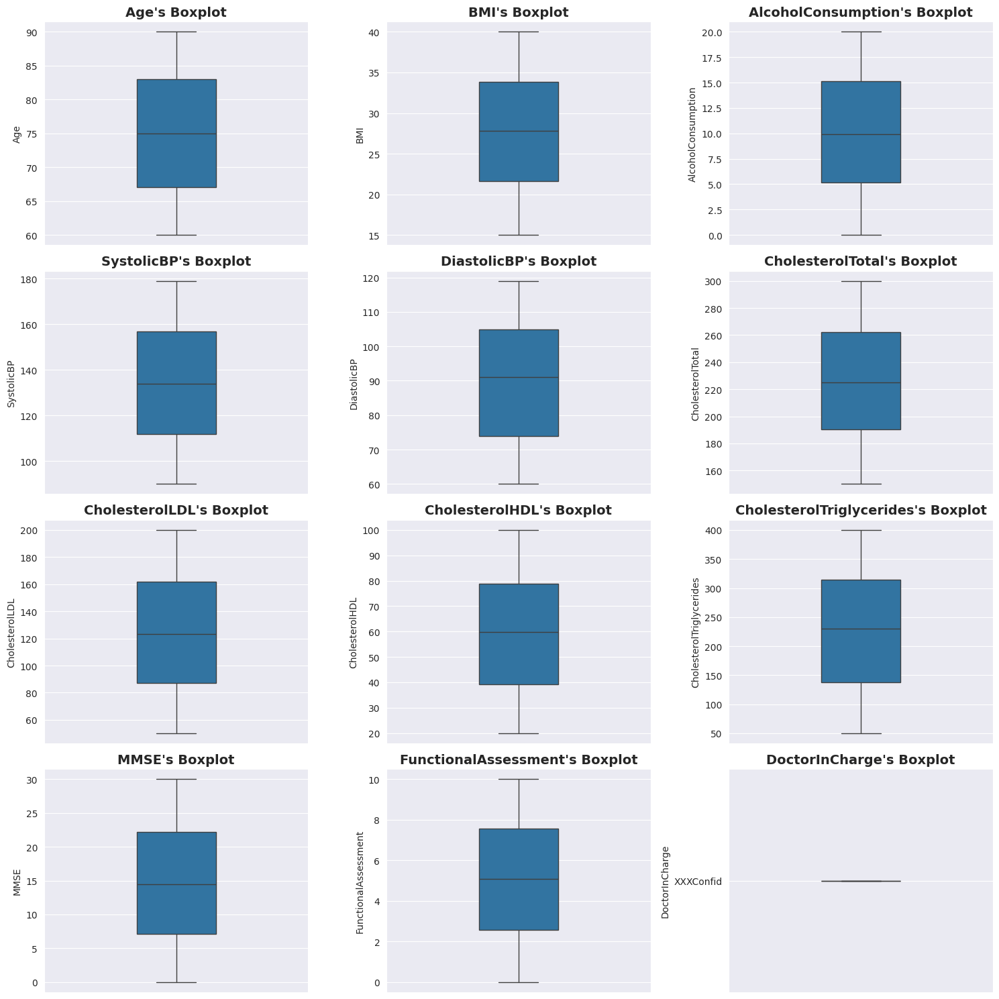

In [ ]:
plt.figure(figsize=(15, 15))
sns.set_style('darkgrid')
for i, var in enumerate(numeric_features[1:], 1):
    plt.subplot(4, 3, i)
    sns.boxplot(data= df,
                y=var,
                width=0.3)
    plt.title(f"{var}'s Boxplot",
              fontsize=14,
              weight="bold")
plt.tight_layout()
plt.show()


1. **Age**:
   - The median age is around 77 years, with a range from approximately 60 to 90 years.
   - The interquartile range (IQR) is about 10-15 years, suggesting a relatively consistent age distribution among the patients.
   - There may be some outliers at the higher end, indicating a few patients are significantly older than the rest.

2. **BMI**:
   - The median BMI is around 28, suggesting that many patients are overweight or borderline obese.
   - The IQR is around 25-32, indicating that most patients have BMIs within this range.
   - There are a few outliers on the higher end, indicating some patients may have very high BMI values.

3. **Alcohol Consumption**:
   - The median alcohol consumption is about 7.5, with a wide range (0 to 20), indicating some patients do not consume alcohol, while others consume high amounts.
   - The IQR suggests that most patients consume between 3 and 12 units of alcohol.

4. **Systolic Blood Pressure (BP)**:
   - The median systolic BP is around 140 mmHg, which is on the higher end of the normal range (120-130 mmHg) and may indicate some patients are at risk for hypertension.
   - The IQR is around 130-150 mmHg, showing that most patients have systolic BP readings within this range.

5. **Diastolic BP**:
   - The median diastolic BP is approximately 90 mmHg, which is near the threshold for hypertension.
   - The IQR suggests most patients have diastolic BP values between 80 and 100 mmHg, indicating potential health risks.

6. **Cholesterol Levels (HDL)**:
   - The median HDL cholesterol level appears to be around 50 mg/dL, which is generally considered acceptable.
   - The IQR is fairly narrow, indicating a consistent range among most patients.

7. **Total Cholesterol**:
   - The median total cholesterol is about 240 mg/dL, which may be concerning as it is at the borderline high level.
   - There are some outliers indicating that some patients have significantly higher total cholesterol levels.

8. **Triglycerides**:
   - The median triglyceride level is around 200 mg/dL, which is at the upper end of the normal range.
   - The IQR suggests a reasonable spread, indicating variability in triglyceride levels among patients.

### General Inferences:
- **Health Risks**: Several measures indicate potential health risks, such as high BMI, elevated blood pressure, and borderline cholesterol levels, which are critical for the management of Alzheimer's disease.
- **Variability**: The presence of outliers in BMI and cholesterol levels indicates a subset of patients with particularly high values, warranting closer monitoring.
- **Public Health Implications**: The data suggest that interventions focused on weight management, blood pressure control, and cholesterol management could be beneficial for this patient population.



##Heatmap

<ipython-input-154-683c69e9414c>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=target_corr_df['Correlation'], y=target_corr_df.index, palette="cubehelix")


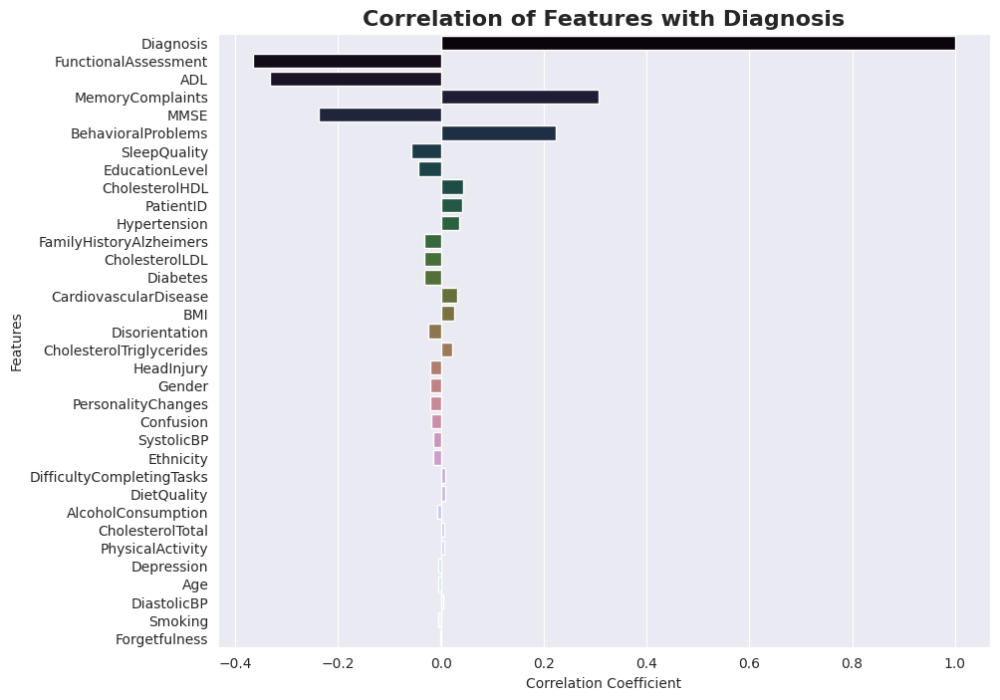

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numeric columns for correlation with the target variable
numeric_df = df.select_dtypes(include=['number'])

# Calculate the correlation of each feature with the target variable 'Diagnosis'
target_corr = numeric_df.corrwith(df['Diagnosis'])

# Convert the Series to a DataFrame for easy plotting
target_corr_df = pd.DataFrame(target_corr, columns=['Correlation'])

# Sort the correlations by their absolute values in descending order
target_corr_df = target_corr_df.reindex(target_corr_df['Correlation'].abs().sort_values(ascending=False).index)

# Plot the correlations with the target variable
plt.figure(figsize=(10, 8))
sns.barplot(x=target_corr_df['Correlation'], y=target_corr_df.index, palette="cubehelix")
plt.title("Correlation of Features with Diagnosis", fontsize=16, weight='bold')
plt.xlabel("Correlation Coefficient")
plt.ylabel("Features")
plt.show()


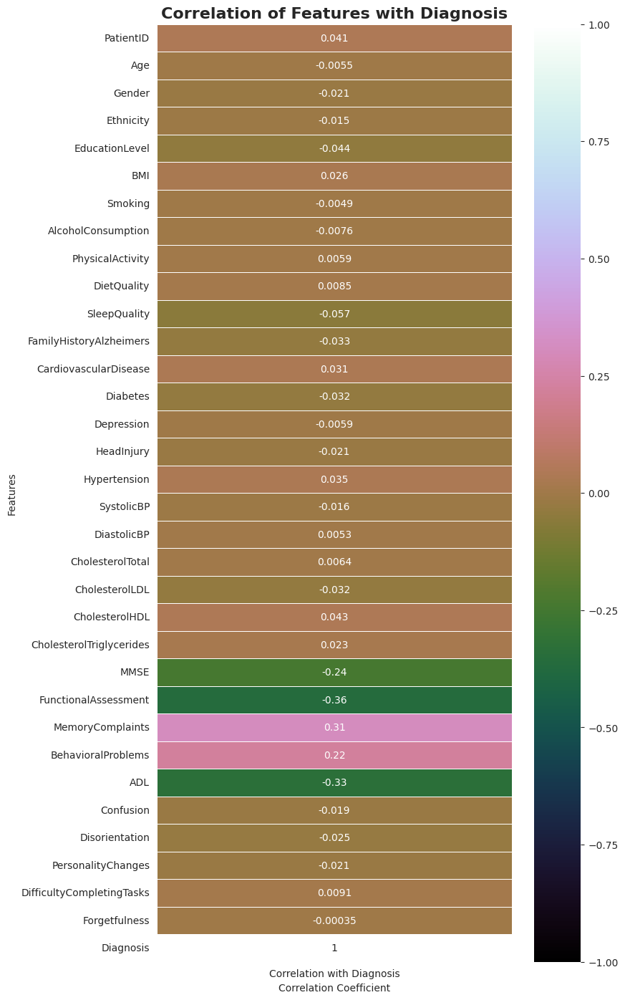

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numeric columns for correlation with the target variable
numeric_df = df.select_dtypes(include=['number'])

# Calculate the correlation of each feature with the target variable 'Diagnosis'
target_corr = numeric_df.corrwith(df['Diagnosis'])

# Convert the Series to a DataFrame for heatmap compatibility
target_corr_df = pd.DataFrame(target_corr, columns=['Correlation with Diagnosis'])

# Plotting the heatmap
plt.figure(figsize=(8, len(target_corr_df) * 0.5))  # Adjust height based on number of features
sns.heatmap(target_corr_df, annot=True, cmap="cubehelix", vmin=-1, vmax=1, linewidths=0.5)
plt.title("Correlation of Features with Diagnosis", fontsize=16, weight='bold')
plt.xlabel("Correlation Coefficient")
plt.ylabel("Features")
plt.show()


The heatmap reveals that the features do not have any strong correlations among themselves. However, there are five columns that show a correlation with the target variable.

calculating Pearson correlation coefficient, also known as Pearson's r. It is a measure of the linear relationship between two variables. It quantifies the degree to which a pair of variables are linearly related, ranging from -1 to 1.



In [ ]:
# Convert Age to numeric if not already
df['Age'] = pd.to_numeric(df['Age'], errors='coerce')

# Fill or drop missing values
df['Age'] = df['Age'].fillna(df['Age'].mean())  # Or use df['Age'].dropna() to remove missing rows


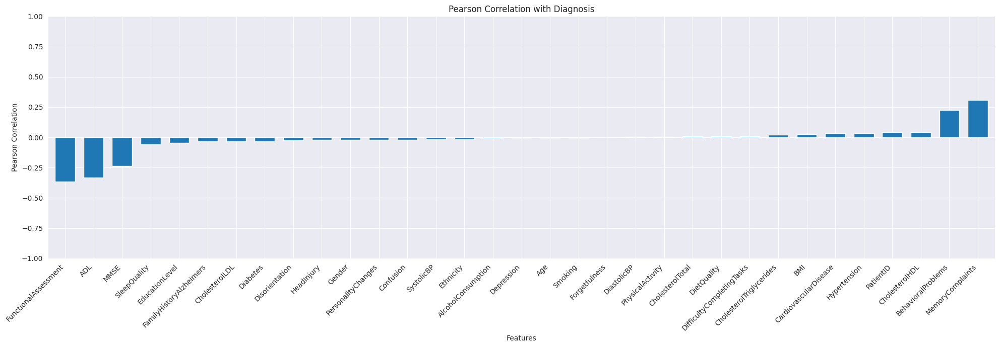

In [ ]:
correlations = df.corr(numeric_only=True)['Diagnosis'][:-1].sort_values()

plt.figure(figsize=(20, 7))

ax = correlations.plot(kind='bar', width=0.7)

ax.set(ylim=[-1, 1], ylabel='Pearson Correlation', xlabel='Features',
       title='Pearson Correlation with Diagnosis')

ax.set_xticklabels(correlations.index, rotation=45, ha='right')

plt.tight_layout()
plt.show()


 The distribution of the most correlated columns across different 'Diagnosis' categories.

visualize both the spread and density of the data points without significant overlap.

#Swarmplots wrt diagnosis

In [ ]:
gender_diagnosis_counts = df.groupby(['Gender', 'Diagnosis']).size().reset_index(name='Count')

# Display the result
print(gender_diagnosis_counts)


   Gender  Diagnosis  Count
0       0          0    675
1       0          1    386
2       1          0    714
3       1          1    374


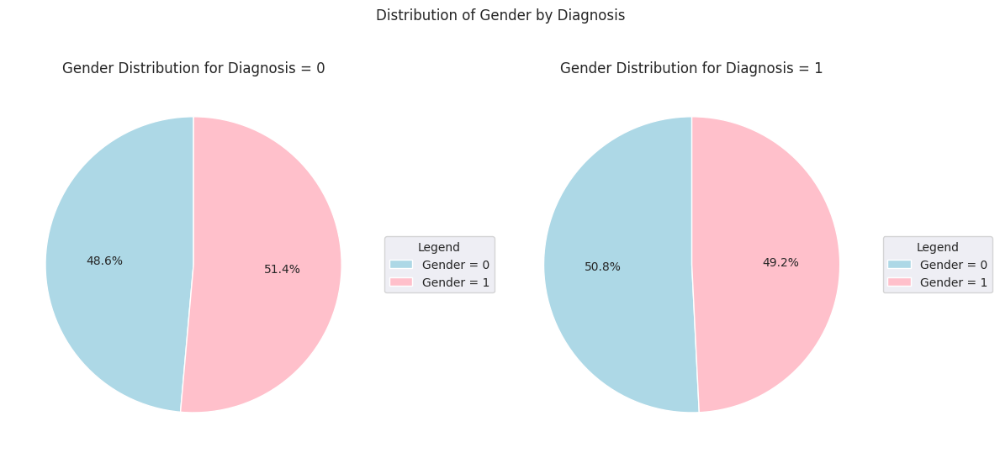

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd


attributes = ['Gender']
colors = ['lightblue', 'pink']

# Loop through each attribute and create side-by-side pie charts
for attribute in attributes:
    # Calculate the counts of each unique value within each Diagnosis category for the attribute
    attribute_diagnosis_count = df.groupby(['Diagnosis', attribute]).size().unstack(fill_value=0)

    # Create subplots for Diagnosis 0 and 1 pie charts
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot pie chart for Diagnosis = 0
    if 0 in attribute_diagnosis_count.index:
        wedges, texts, autotexts = axes[0].pie(
            attribute_diagnosis_count.loc[0],
            colors=colors[:len(attribute_diagnosis_count.columns)],
            startangle=90,
            autopct='%1.1f%%'
        )
        axes[0].set_title(f"{attribute} Distribution for Diagnosis = 0")
        axes[0].legend(wedges, [f"{attribute} = {value}" for value in attribute_diagnosis_count.columns], title="Legend", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    # Plot pie chart for Diagnosis = 1
    if 1 in attribute_diagnosis_count.index:
        wedges, texts, autotexts = axes[1].pie(
            attribute_diagnosis_count.loc[1],
            colors=colors[:len(attribute_diagnosis_count.columns)],
            startangle=90,
            autopct='%1.1f%%'
        )
        axes[1].set_title(f"{attribute} Distribution for Diagnosis = 1")
        axes[1].legend(wedges, [f"{attribute} = {value}" for value in attribute_diagnosis_count.columns], title="Legend", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    # Adjust layout and show the plot
    plt.suptitle(f"Distribution of {attribute} by Diagnosis")
    plt.tight_layout()
    plt.show()


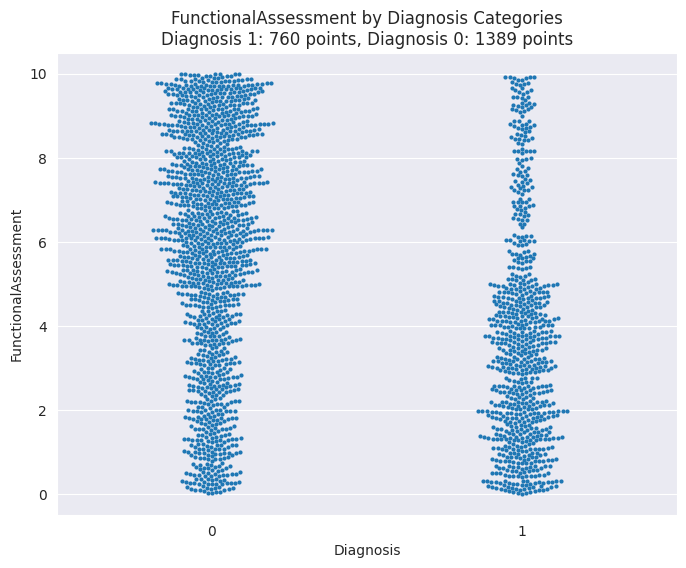

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


count_per_category = df.groupby('Diagnosis')['FunctionalAssessment'].count()

# Create the swarm plot
plt.figure(figsize=(8, 6))
sns.swarmplot(data=df, y='FunctionalAssessment', x='Diagnosis', size=3)
plt.title(f'FunctionalAssessment by Diagnosis Categories\n'
          f'Diagnosis 1: {count_per_category[1]} points, Diagnosis 0: {count_per_category[0]} points')
plt.xlabel("Diagnosis")
plt.ylabel("FunctionalAssessment")

# Show the plot
plt.show()


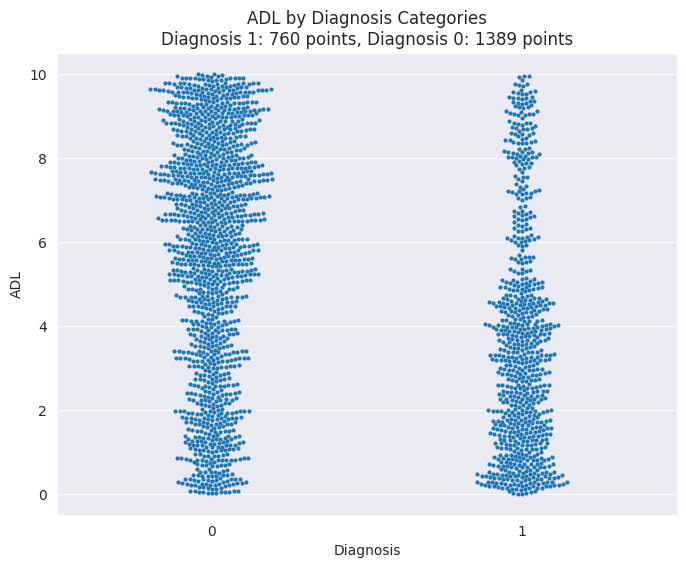

In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt


count_per_category = df.groupby('Diagnosis')['ADL'].count()

# Create the swarm plot
plt.figure(figsize=(8, 6))
sns.swarmplot(data=df, y='ADL', x='Diagnosis', size=3)
plt.title(f'ADL by Diagnosis Categories\n'
          f'Diagnosis 1: {count_per_category[1]} points, Diagnosis 0: {count_per_category[0]} points')
plt.xlabel("Diagnosis")
plt.ylabel("ADL")

# Show the plot
plt.show()


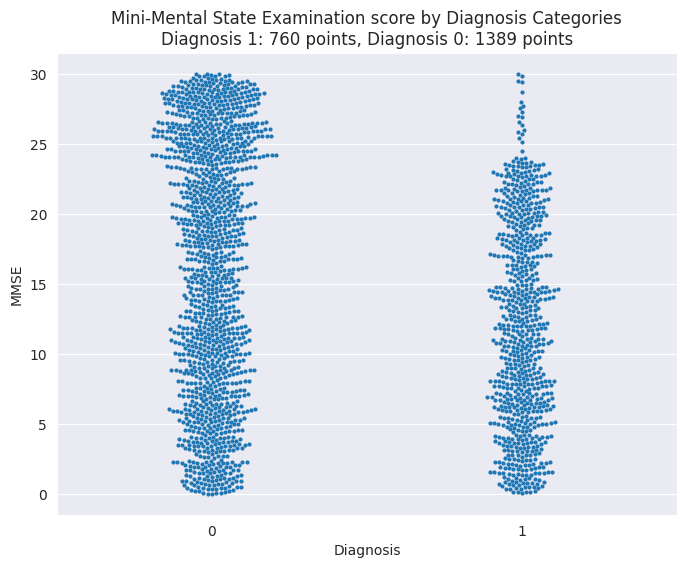

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the number of non-null MMSE scores for each Diagnosis category
count_per_category = df.groupby('Diagnosis')['MMSE'].count()

# Create the swarm plot
plt.figure(figsize=(8, 6))
sns.swarmplot(data=df, y='MMSE', x='Diagnosis', size=3)
plt.title(f'Mini-Mental State Examination score by Diagnosis Categories\n'
          f'Diagnosis 1: {count_per_category[1]} points, Diagnosis 0: {count_per_category[0]} points')
plt.xlabel("Diagnosis")
plt.ylabel("MMSE")

# Show the plot
plt.show()


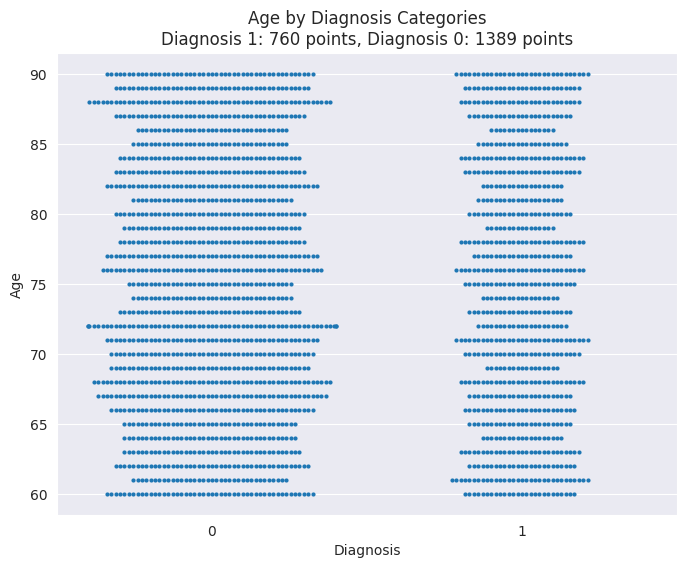

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


count_per_category = df.groupby('Diagnosis')['Age'].count()

# Create the swarm plot
plt.figure(figsize=(8, 6))
sns.swarmplot(data=df, y='Age', x='Diagnosis', size=3)
plt.title(f'Age by Diagnosis Categories\n'
          f'Diagnosis 1: {count_per_category[1]} points, Diagnosis 0: {count_per_category[0]} points')
plt.xlabel("Diagnosis")
plt.ylabel("Age")

# Show the plot
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 77.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 59.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 87.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 77.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


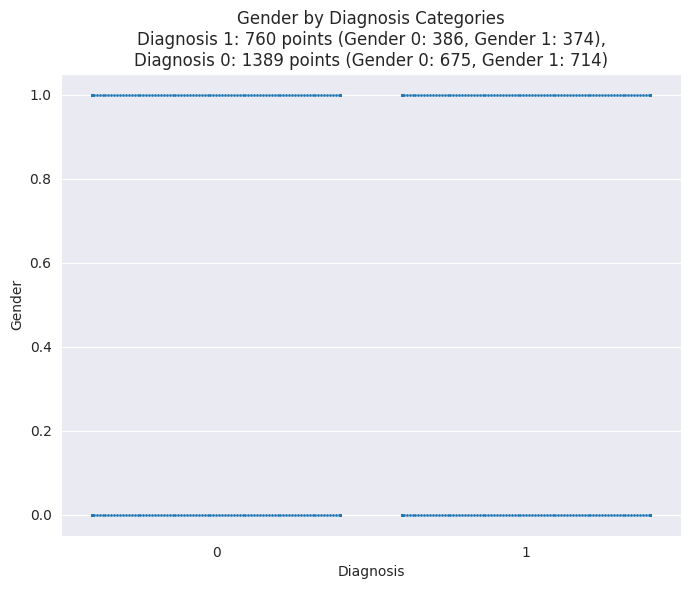

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Sample DataFrame for demonstration (replace with your actual dataset)
# df = pd.read_csv('your_file.csv')

# Calculate counts of each Gender within each Diagnosis category
gender_diagnosis_count = df.groupby(['Diagnosis', 'Gender']).size().unstack(fill_value=0)

# Get the total count per Diagnosis for display in the title
count_per_category = df['Diagnosis'].value_counts()

# Create the swarm plot
plt.figure(figsize=(8, 6))
sns.swarmplot(data=df, x='Diagnosis', y='Gender', size=2)
plt.title(f'Gender by Diagnosis Categories\n'
          f'Diagnosis 1: {count_per_category[1]} points '
          f'(Gender 0: {gender_diagnosis_count[0][1]}, Gender 1: {gender_diagnosis_count[1][1]}),\n'
          f'Diagnosis 0: {count_per_category[0]} points '
          f'(Gender 0: {gender_diagnosis_count[0][0]}, Gender 1: {gender_diagnosis_count[1][0]})')
plt.xlabel("Diagnosis")
plt.ylabel("Gender")

# Show the plot
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 85.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 72.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 91.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 85.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


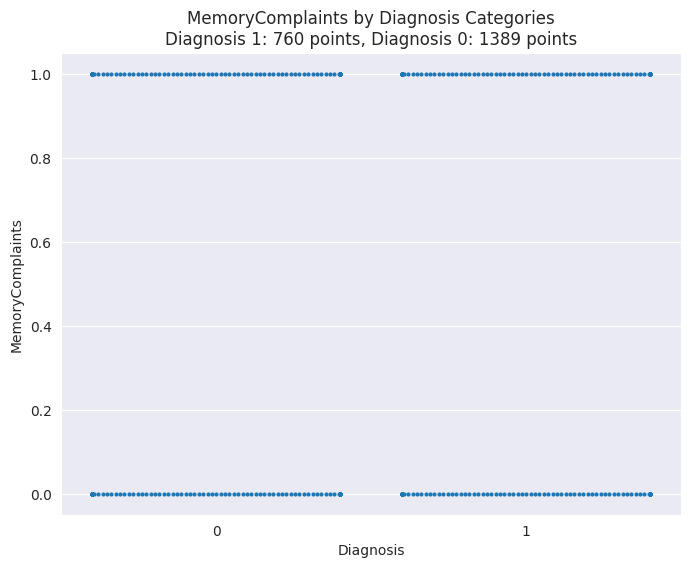

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


count_per_category = df.groupby('Diagnosis')['MemoryComplaints'].count()

# Create the swarm plot
plt.figure(figsize=(8, 6))
sns.swarmplot(data=df, y='MemoryComplaints', x='Diagnosis', size=3)
plt.title(f'MemoryComplaints by Diagnosis Categories\n'
          f'Diagnosis 1: {count_per_category[1]} points, Diagnosis 0: {count_per_category[0]} points')
plt.xlabel("Diagnosis")
plt.ylabel("MemoryComplaints")

# Show the plot
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 85.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 72.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 91.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3399: UserWarning: 85.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


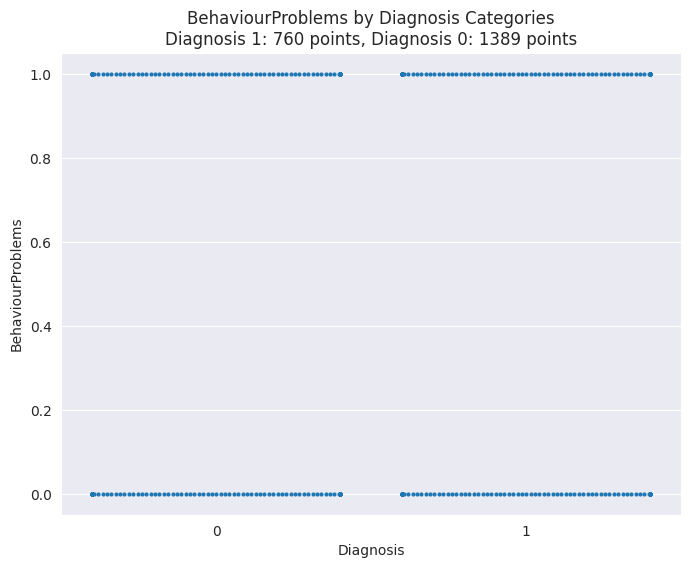

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


count_per_category = df.groupby('Diagnosis')['BehavioralProblems'].count()

# Create the swarm plot
plt.figure(figsize=(8, 6))
sns.swarmplot(data=df, y='BehavioralProblems', x='Diagnosis', size=3)
plt.title(f'BehaviourProblems by Diagnosis Categories\n'
          f'Diagnosis 1: {count_per_category[1]} points, Diagnosis 0: {count_per_category[0]} points')
plt.xlabel("Diagnosis")
plt.ylabel("BehaviourProblems")

# Show the plot
plt.show()


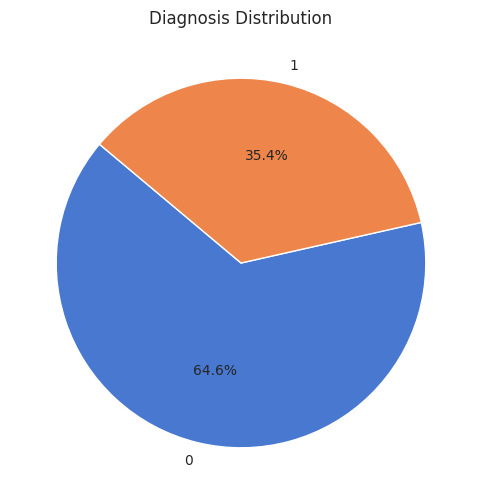

In [ ]:
# Define the Response categories and count occurences
categories = [0, 1]
counts = df.Diagnosis.value_counts().tolist()

# Choose a color palette from Seaborn for the pie chart
colors = sns.color_palette("muted")

# Plot the pie chart with the counts of each response category
plt.figure(figsize=(6, 6))
plt.pie(counts, labels=categories, autopct='%1.1f%%', startangle=140, colors=colors)
plt.title('Diagnosis Distribution')
plt.show()


#Social Network Analysis(SNA)

visualize the relationships between patients and their healthcare providers (doctors).

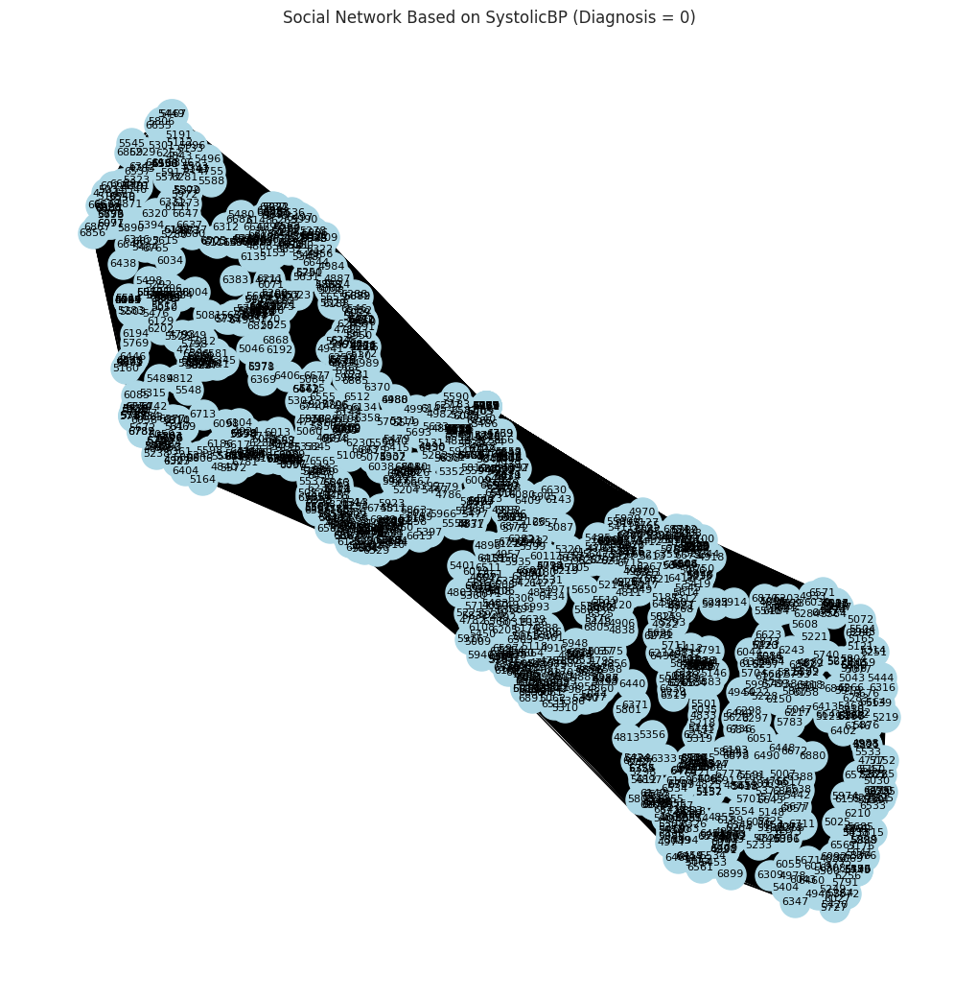

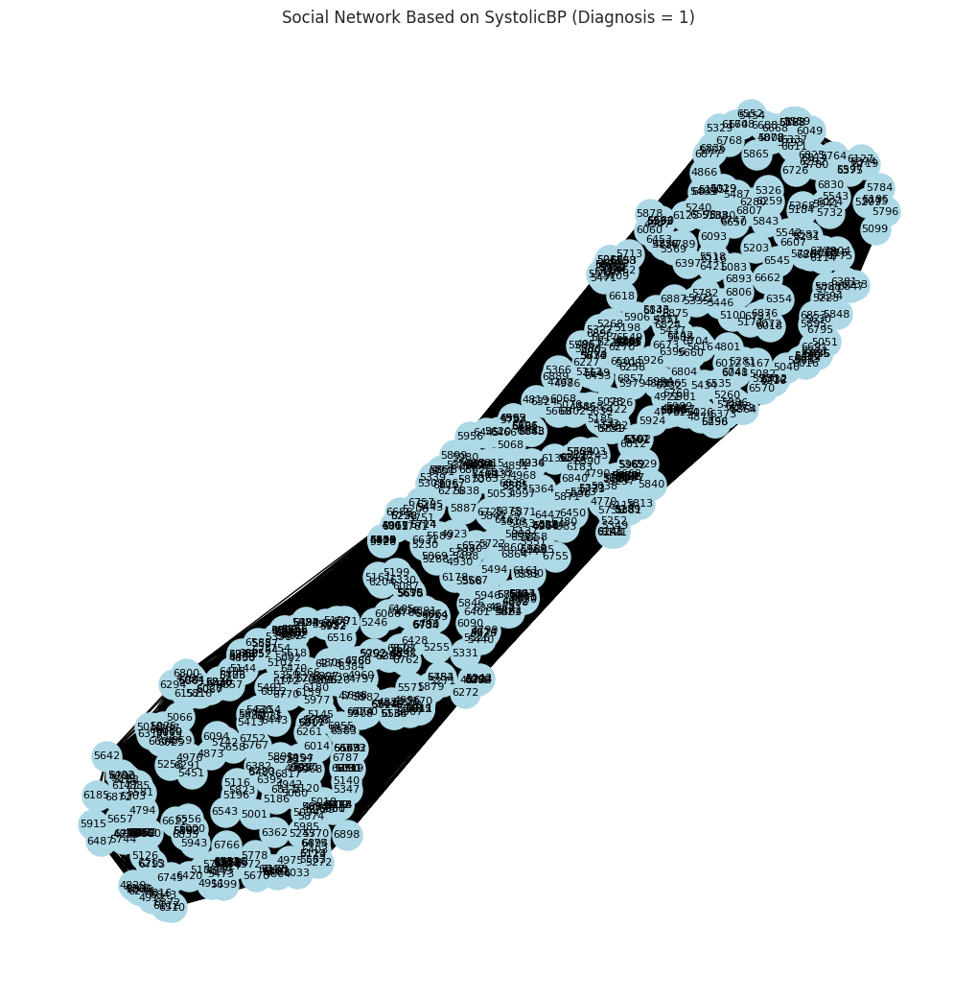

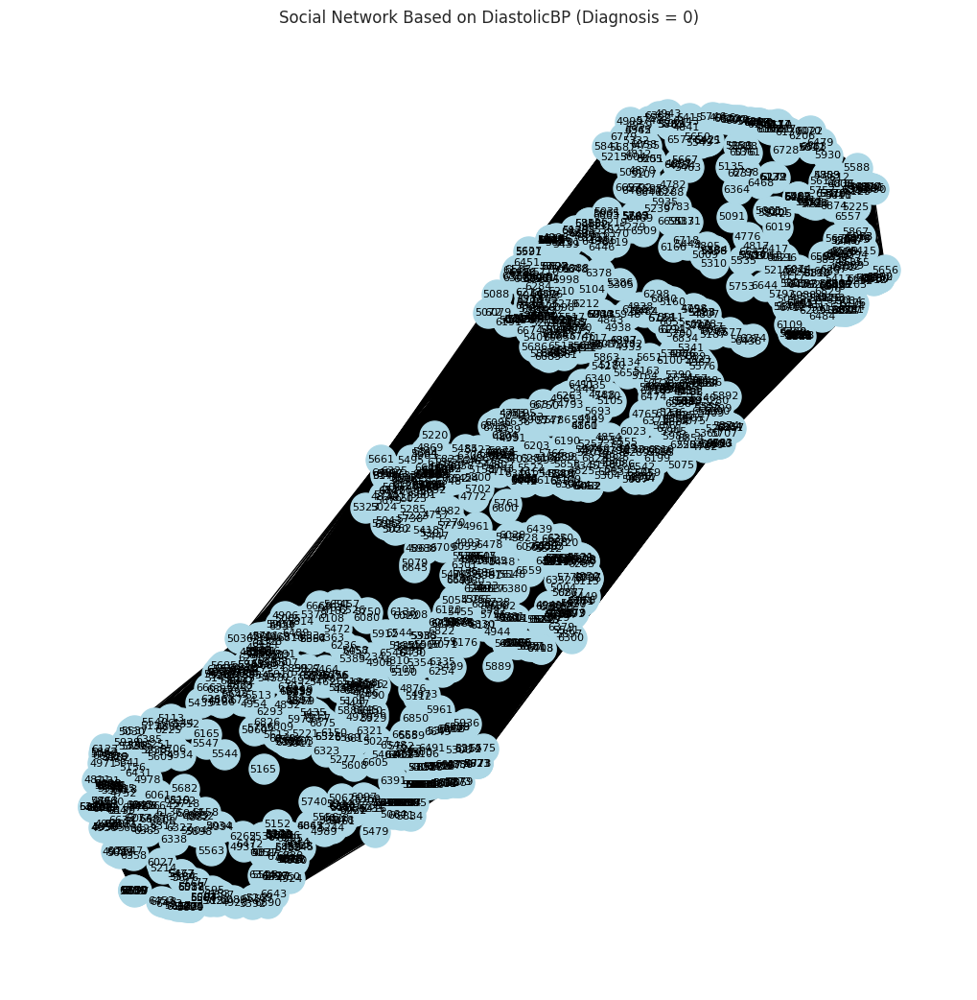

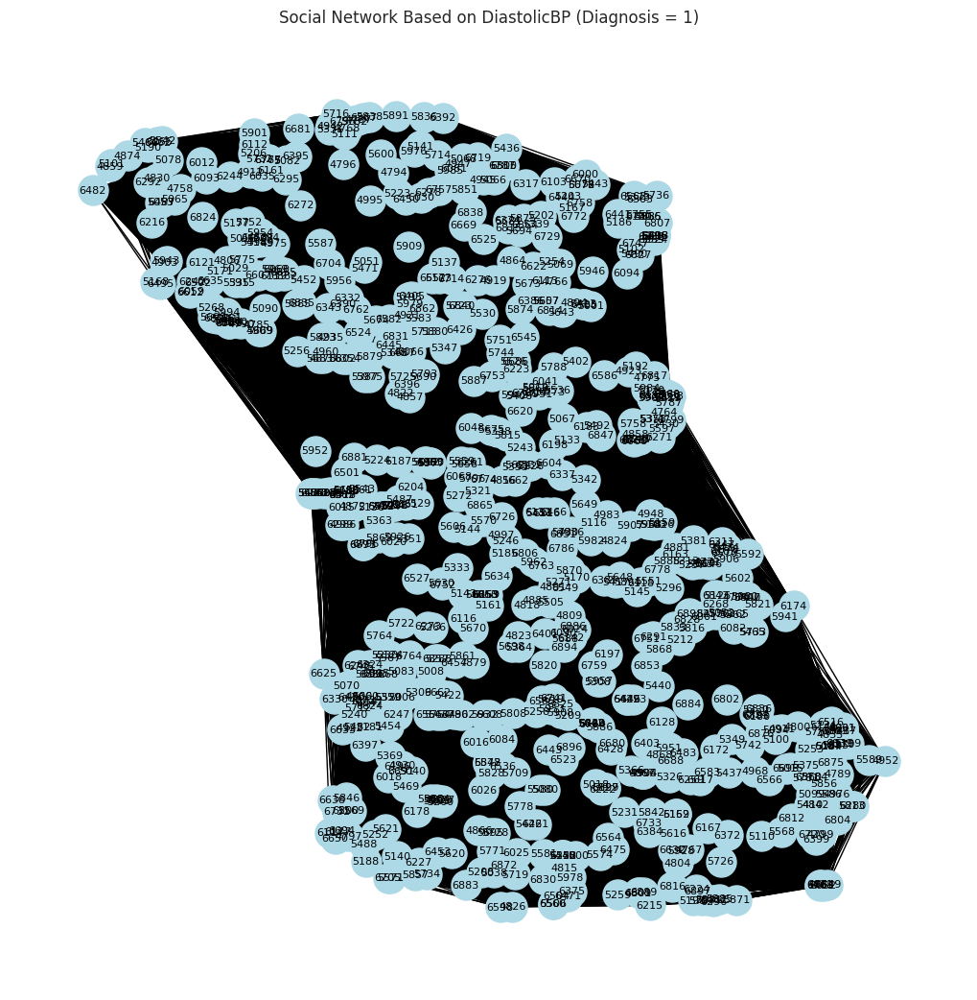

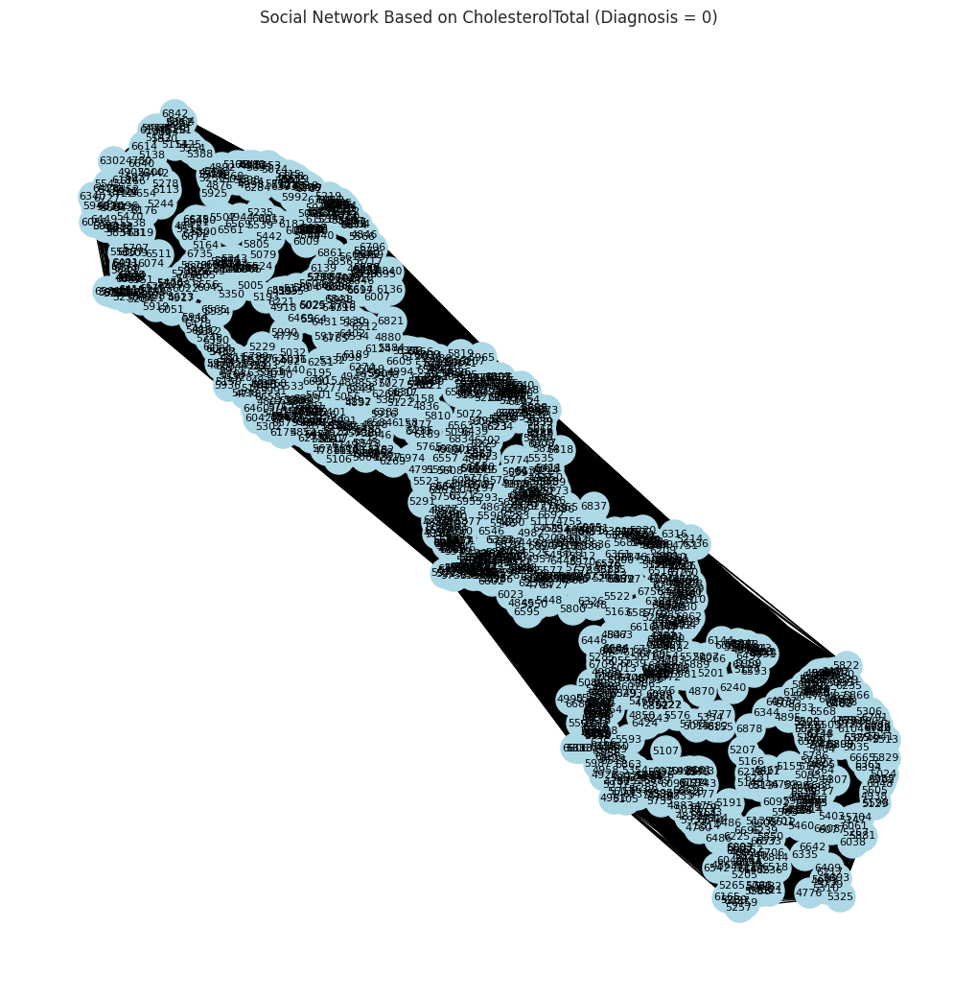

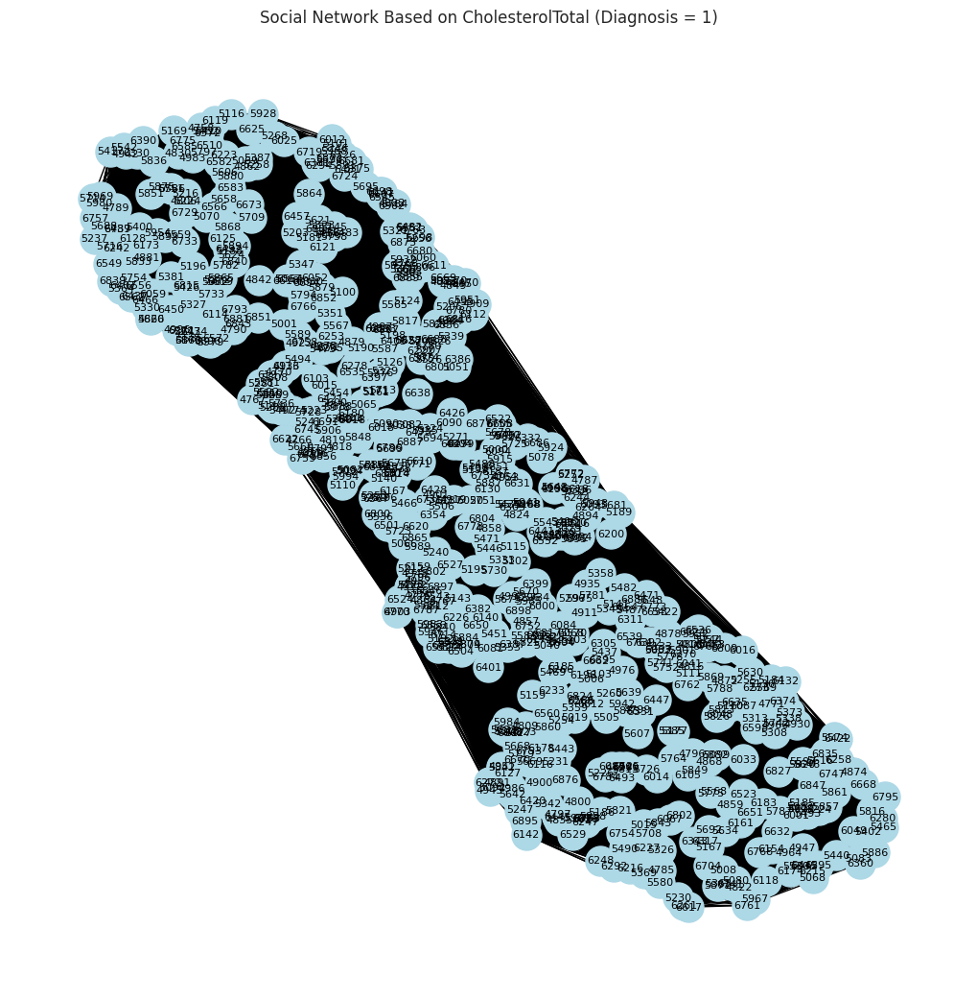

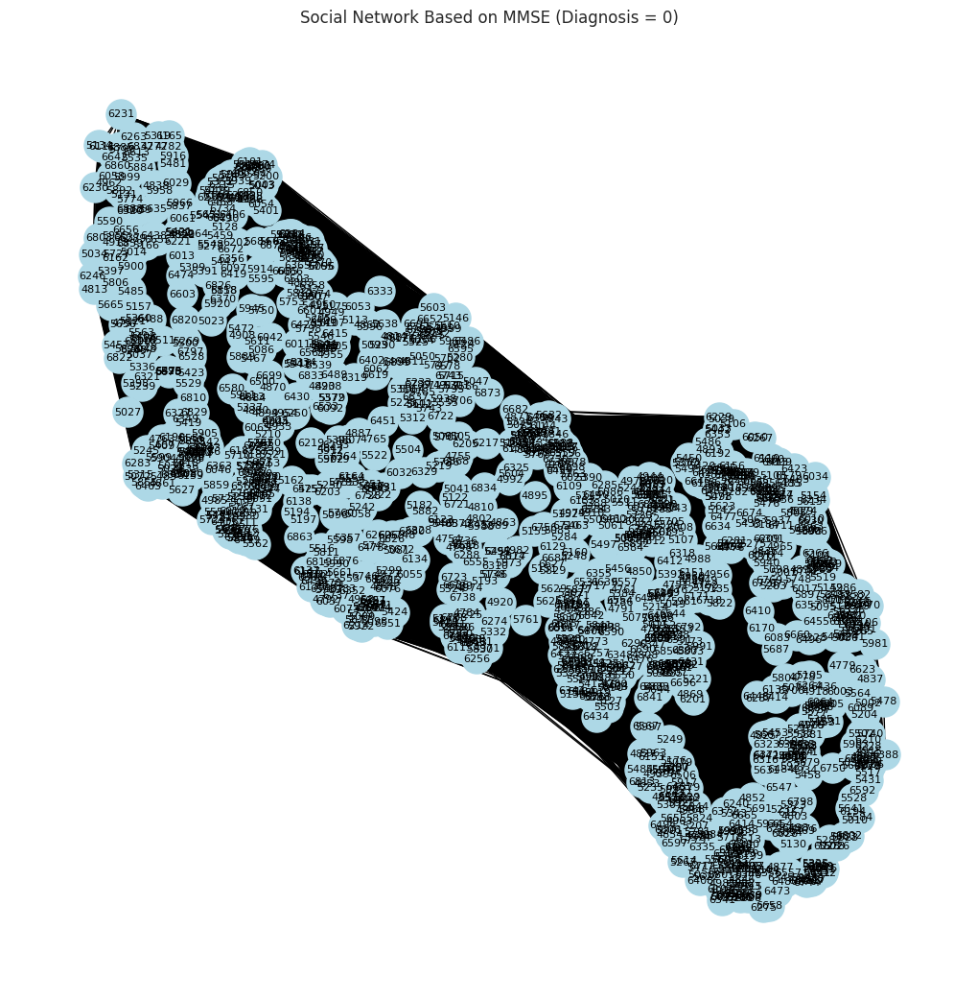

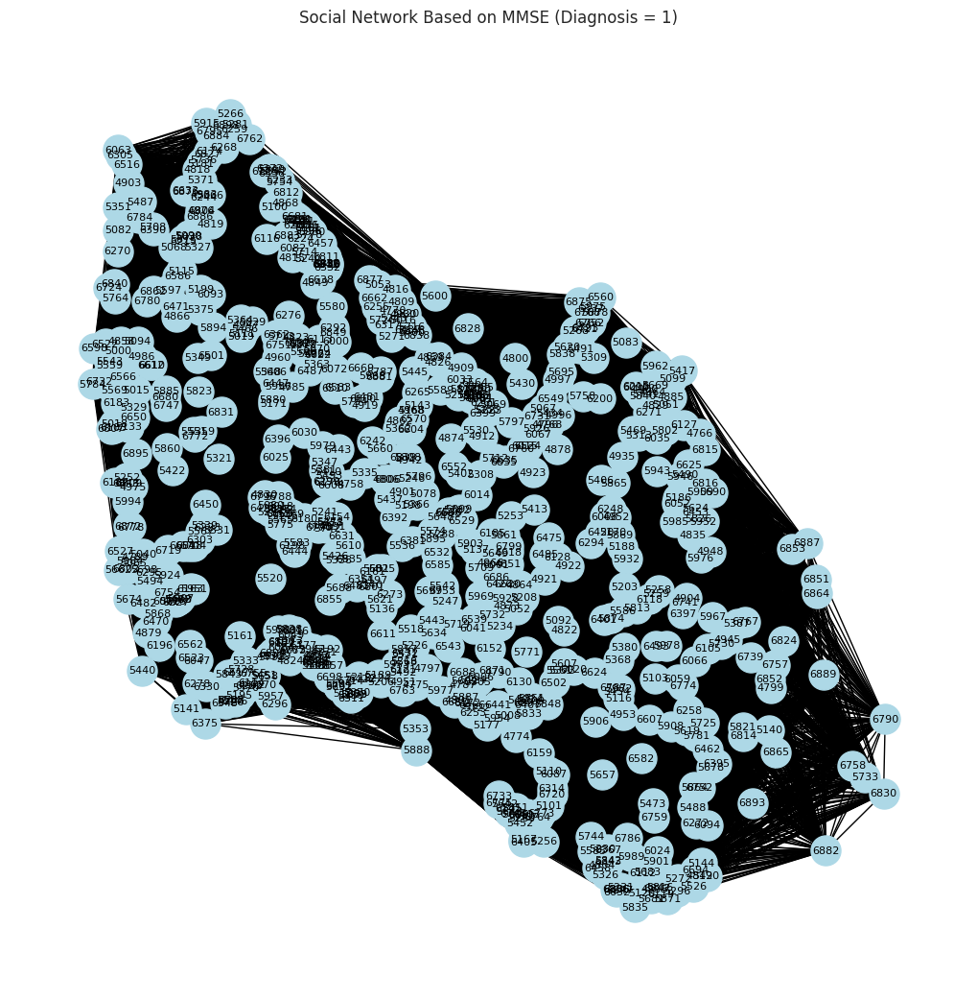

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics.pairwise import euclidean_distances

# List of health attributes to construct networks for
attributes = ['SystolicBP', 'DiastolicBP', 'CholesterolTotal', 'MMSE']

# Drop rows with missing values in the selected attributes
df_clean = df.dropna(subset=attributes)

# Normalize the attributes (scale between 0 and 1)
scaler = MinMaxScaler()
df_clean[attributes] = scaler.fit_transform(df_clean[attributes])

# Function to construct and visualize network for a single attribute and a specific diagnosis group
def construct_network(attribute, diagnosis, threshold=0.3):
    # Filter data based on diagnosis
    df_filtered = df_clean[df_clean['Diagnosis'] == diagnosis]

    # Calculate the pairwise Euclidean distances between patients for the given attribute
    distances = euclidean_distances(df_filtered[[attribute]])

    # Create an empty graph
    G = nx.Graph()

    # Add patients as nodes
    patients = df_filtered['PatientID'].unique()
    for patient in patients:
        G.add_node(patient)

    # Add edges based on distance threshold
    for i in range(len(patients)):
        for j in range(i + 1, len(patients)):
            if distances[i, j] < threshold:  # Add an edge if the distance is below the threshold
                G.add_edge(patients[i], patients[j])

    # Visualize the graph
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(G)  # for a better layout of the graph
    nx.draw(G, pos, with_labels=True, node_color='lightblue', font_size=8, node_size=500)
    plt.title(f"Social Network Based on {attribute} (Diagnosis = {diagnosis})")
    plt.show()

# Construct separate networks for each attribute and diagnosis
for attribute in attributes:
    for diagnosis in [0, 1]:
        construct_network(attribute, diagnosis)


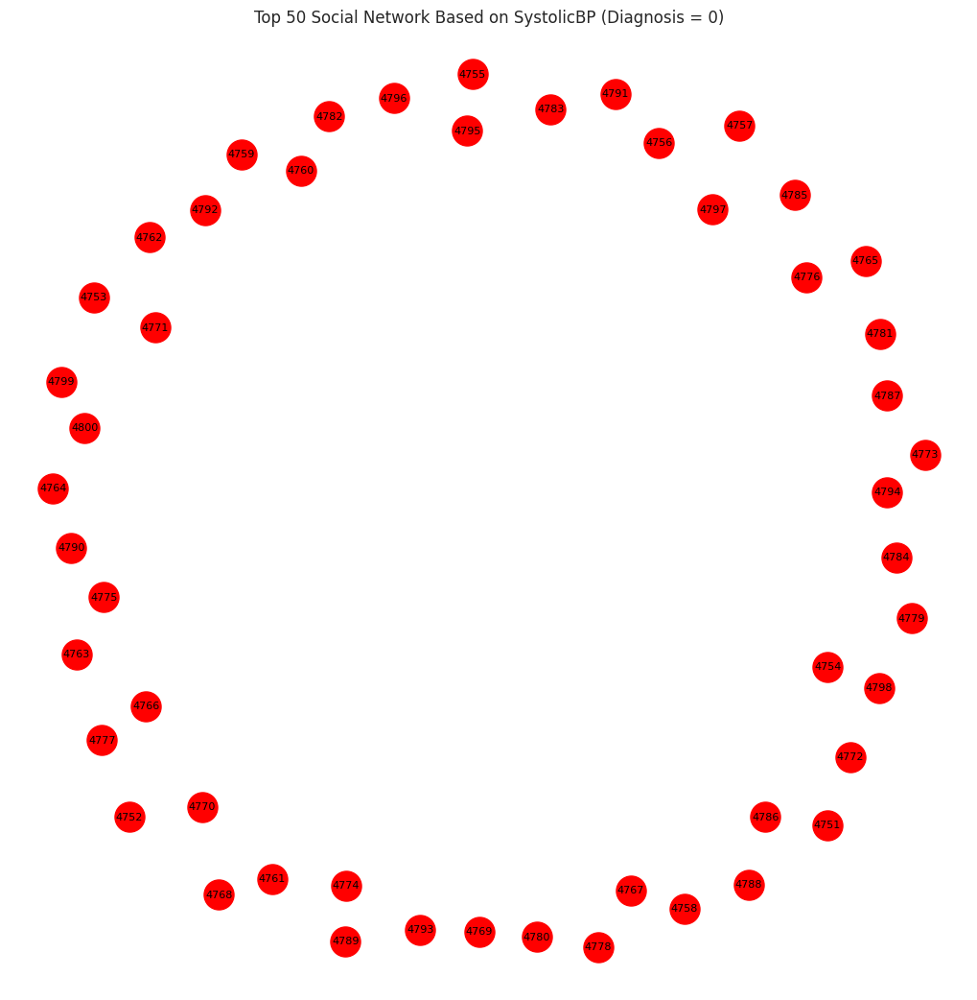

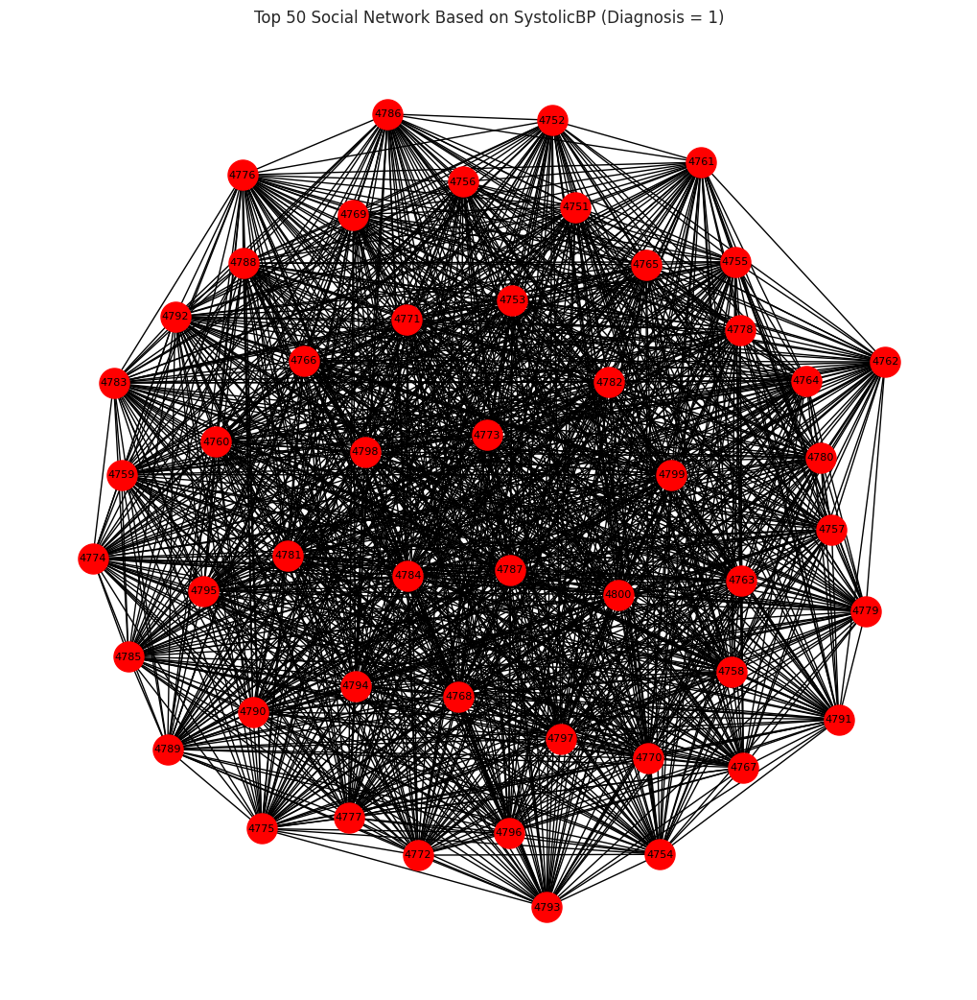

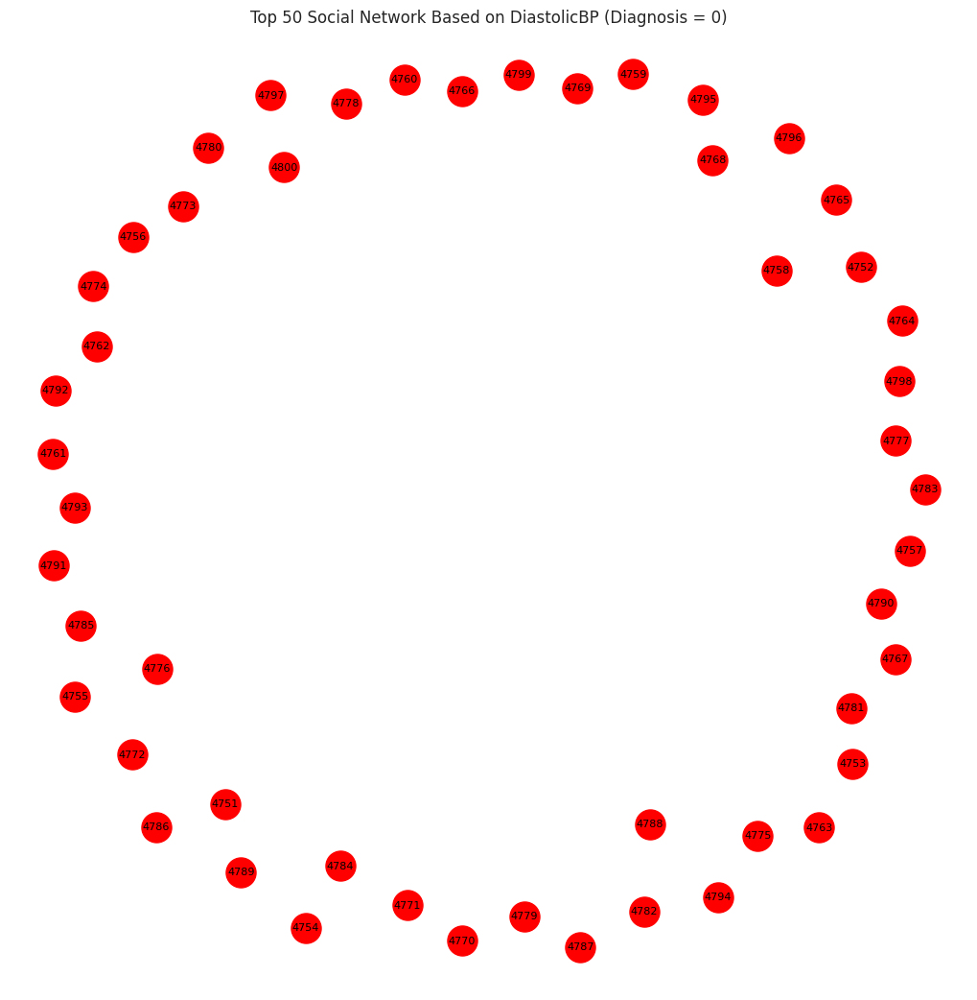

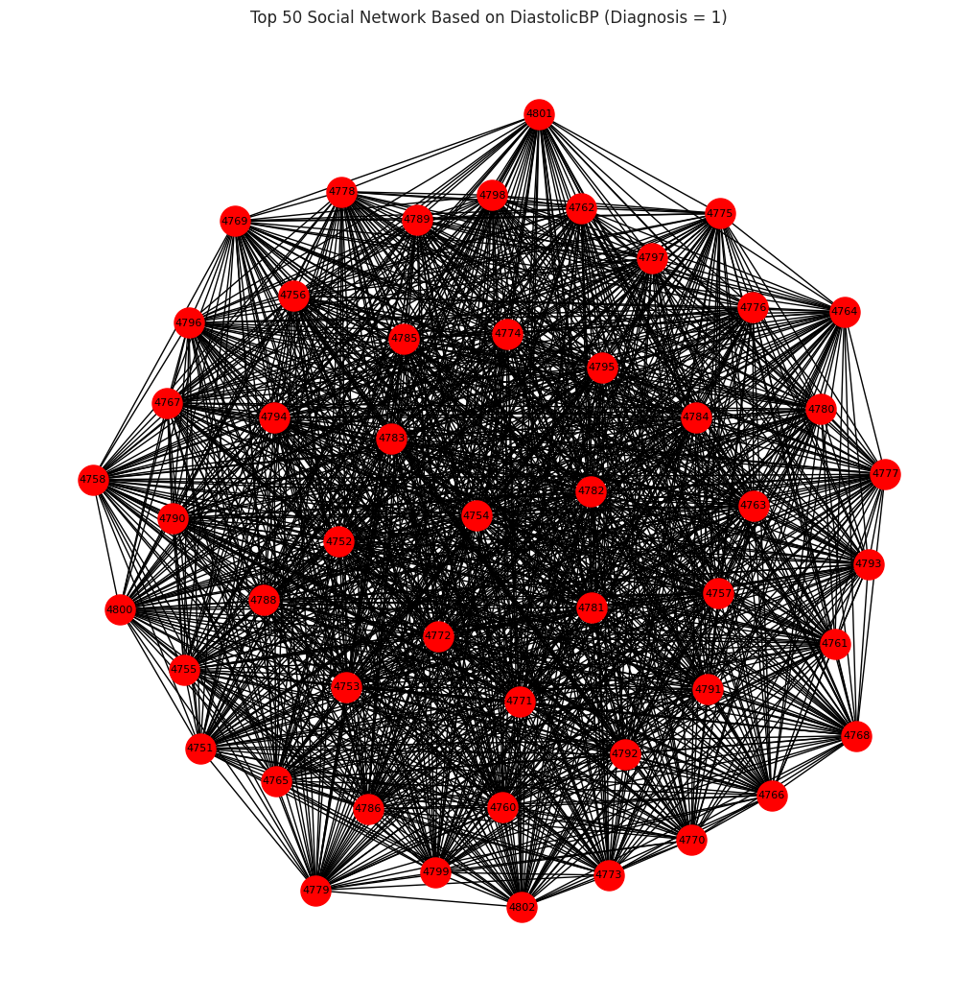

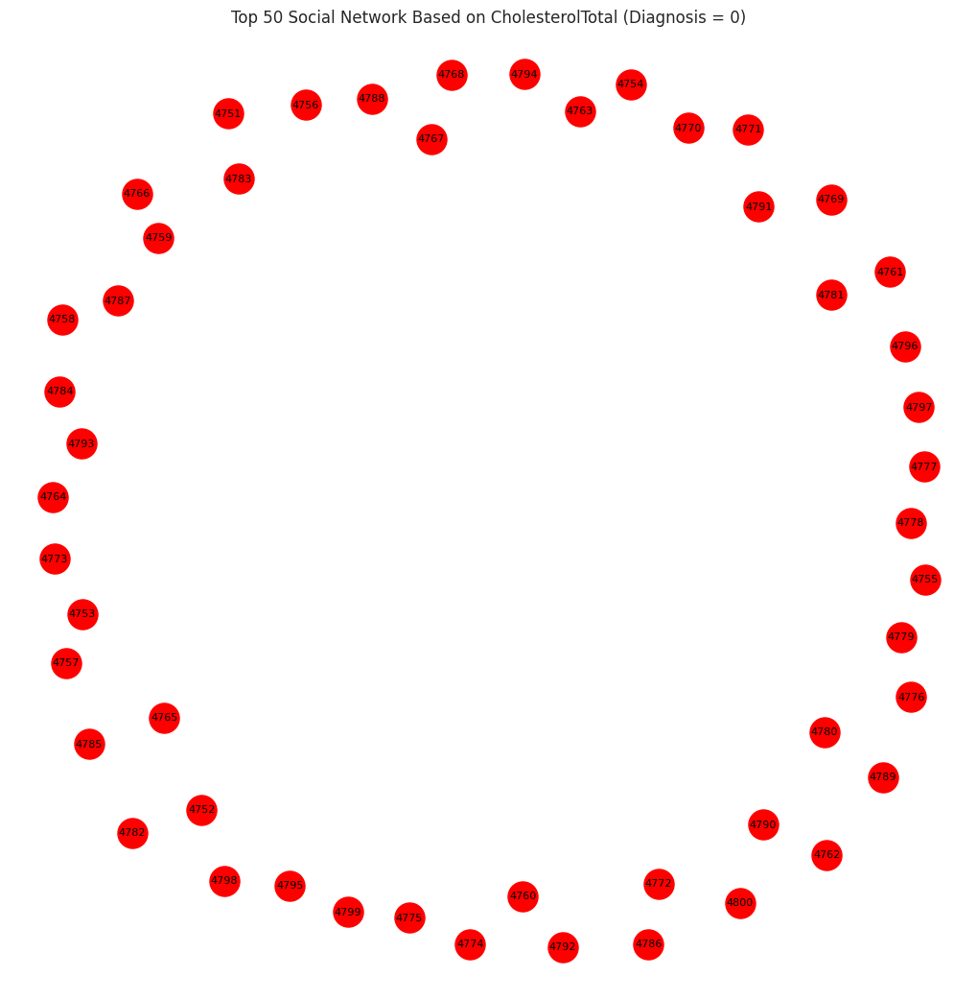

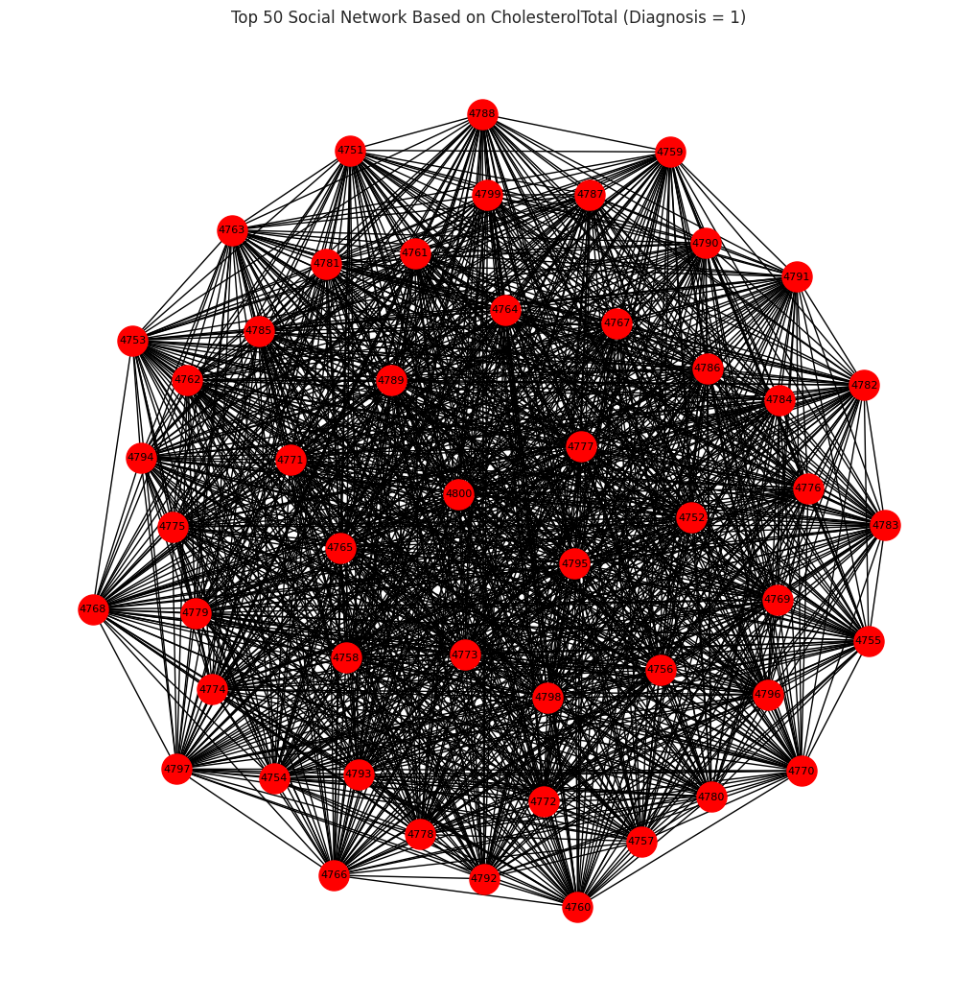

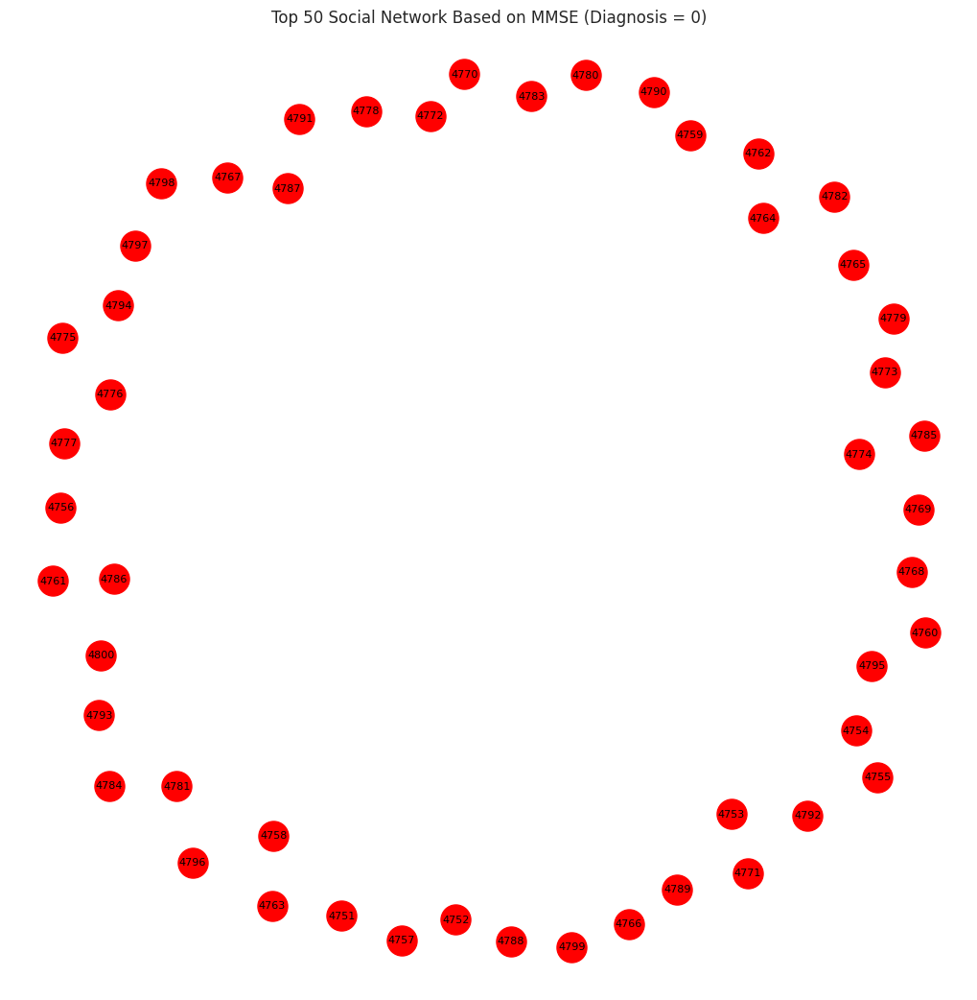

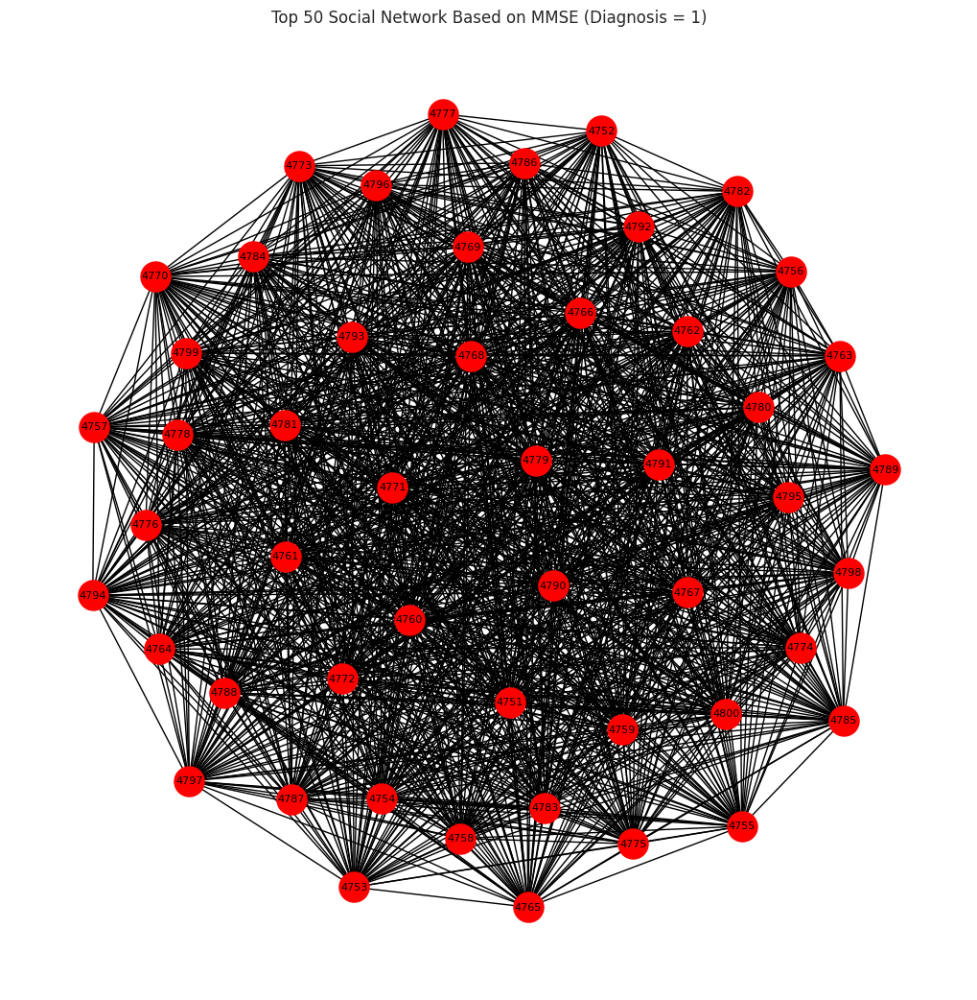

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics.pairwise import euclidean_distances

# List of health attributes to construct networks for
attributes = ['SystolicBP', 'DiastolicBP', 'CholesterolTotal', 'MMSE']

# Drop rows with missing values in the selected attributes
df_clean = df.dropna(subset=attributes)

# Normalize the attributes (scale between 0 and 1)
scaler = MinMaxScaler()
df_clean[attributes] = scaler.fit_transform(df_clean[attributes])

# Function to construct and visualize a cleaner network for a single attribute
def construct_network(attribute, threshold=0.3, top_n=50):
    # Calculate the pairwise Euclidean distances between patients for the given attribute
    distances = euclidean_distances(df_clean[[attribute]])

    # Create an empty graph
    G = nx.Graph()

    # Add patients as nodes
    patients = df_clean['PatientID'].unique()
    for patient in patients:
        G.add_node(patient)

    # Add edges based on distance threshold
    for i in range(len(patients)):
        for j in range(i + 1, len(patients)):
            if distances[i, j] < threshold:  # Add an edge if the distance is below the threshold
                G.add_edge(patients[i], patients[j])

    # Calculate degree centrality to rank nodes
    centrality = nx.degree_centrality(G)

    # Sort nodes by centrality and select the top N nodes
    top_nodes = sorted(centrality, key=centrality.get, reverse=True)[:top_n]

    # Create a subgraph with the top N nodes
    subgraph = G.subgraph(top_nodes)

    # Visualize the subgraph
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(subgraph)  # for a better layout of the graph
    nx.draw(subgraph, pos, with_labels=True, node_color='red', font_size=8, node_size=500)
    plt.title(f"Top {top_n} Social Network Based on {attribute} (Diagnosis = {diagnosis})")
    plt.show()

# Construct a cleaner network for each attribute (with only the top nodes)
for attribute in attributes:
    for diagnosis in [0, 1]:
        construct_network(attribute, diagnosis)


###centrality measures


Centrality Measures DataFrame:
       Degree Centrality  Betweenness Centrality  Closeness Centrality  \
4751           0.587058                0.000578              0.707743   
4752           0.583333                0.000532              0.647573   
4753           0.400372                0.000027              0.515726   
4754           0.591713                0.000583              0.663577   
4755           0.347765                0.000005              0.479037   
...                 ...                     ...                   ...   
6895           0.590317                0.000577              0.681472   
6896           0.587989                0.000652              0.656680   
6897           0.583333                0.000532              0.647573   
6898           0.445996                0.000067              0.549642   
6899           0.439013                0.000065              0.545316   

      Eigenvector Centrality  
4751                0.027162  
4752                0.023998

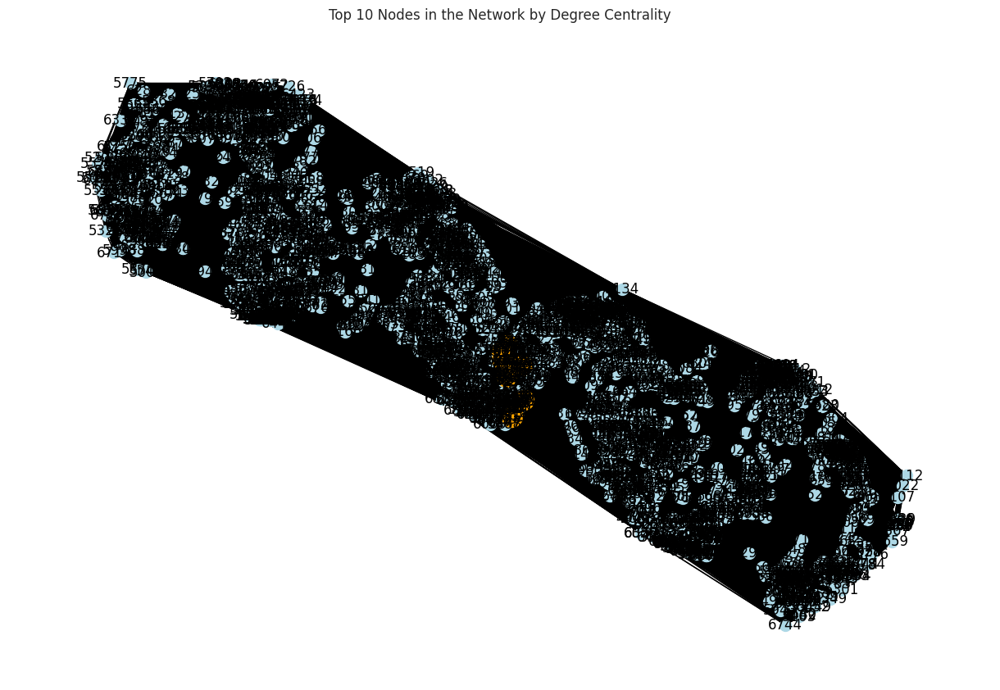


Centrality Measures DataFrame:
       Degree Centrality  Betweenness Centrality  Closeness Centrality  \
4751           0.587058                0.000578              0.707743   
4752           0.583333                0.000532              0.647573   
4753           0.400372                0.000027              0.515726   
4754           0.591713                0.000583              0.663577   
4755           0.347765                0.000005              0.479037   
...                 ...                     ...                   ...   
6895           0.590317                0.000577              0.681472   
6896           0.587989                0.000652              0.656680   
6897           0.583333                0.000532              0.647573   
6898           0.445996                0.000067              0.549642   
6899           0.439013                0.000065              0.545316   

      Eigenvector Centrality  
4751                0.027162  
4752                0.023998

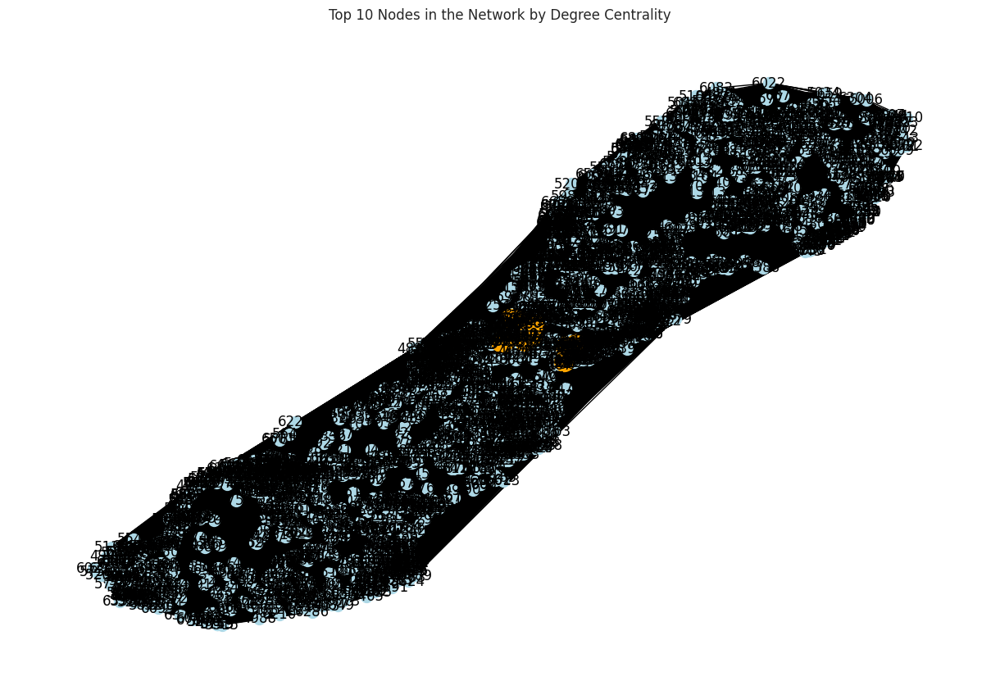

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics.pairwise import euclidean_distances


# List of health attributes to construct networks for
attributes = ['SystolicBP', 'DiastolicBP', 'CholesterolTotal', 'MMSE']

# Drop rows with missing values in the selected attributes
df_clean = df.dropna(subset=attributes)

# Normalize the attributes (scale between 0 and 1)
scaler = MinMaxScaler()
df_clean[attributes] = scaler.fit_transform(df_clean[attributes])

# Function to construct network for a single attribute and threshold
def construct_network(attribute, threshold=0.3):
    # Calculate pairwise Euclidean distances for the attribute
    distances = euclidean_distances(df_clean[[attribute]])

    # Create a graph
    G = nx.Graph()
    patients = df_clean['PatientID'].values
    G.add_nodes_from(patients)

    # Add edges based on distance threshold
    for i in range(len(patients)):
        for j in range(i + 1, len(patients)):
            if distances[i, j] < threshold:
                G.add_edge(patients[i], patients[j])

    return G

# Construct graph for one attribute (e.g., 'SystolicBP')
G = construct_network('SystolicBP', threshold=0.3)

# 1. Degree Centrality
degree_centrality = nx.degree_centrality(G)

# 2. Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(G)

# 3. Closeness Centrality
closeness_centrality = nx.closeness_centrality(G)

# 4. Eigenvector Centrality
try:
    eigenvector_centrality = nx.eigenvector_centrality(G)
except nx.PowerIterationFailedConvergence:
    print("Eigenvector centrality calculation did not converge.")
    eigenvector_centrality = None

# Combine centrality measures into a DataFrame
centrality_df = pd.DataFrame({
    'Degree Centrality': degree_centrality,
    'Betweenness Centrality': betweenness_centrality,
    'Closeness Centrality': closeness_centrality
})

# Add Eigenvector Centrality if calculated successfully
if eigenvector_centrality is not None:
    centrality_df['Eigenvector Centrality'] = eigenvector_centrality

# Display centrality measures
print("\nCentrality Measures DataFrame:\n", centrality_df)

# Identify and display top 10 nodes by degree centrality
top_central_nodes = centrality_df.sort_values(by='Degree Centrality', ascending=False).head(10)
print("\nTop 10 Nodes by Degree Centrality:\n", top_central_nodes)

# Visualize top nodes based on degree centrality
plt.figure(figsize=(12, 8))
top_nodes = list(top_central_nodes.index)
pos = nx.spring_layout(G)
nx.draw(G, pos, node_color='lightblue', with_labels=True, node_size=100)
nx.draw_networkx_nodes(G, pos, nodelist=top_nodes, node_color='orange', node_size=300)
plt.title("Top 10 Nodes in the Network by Degree Centrality")
plt.show()

# 1. Degree Centrality
degree_centrality = nx.degree_centrality(G)

# 2. Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(G)

# 3. Closeness Centrality
closeness_centrality = nx.closeness_centrality(G)

# 4. Eigenvector Centrality
try:
    eigenvector_centrality = nx.eigenvector_centrality(G)
except nx.PowerIterationFailedConvergence:
    print("Eigenvector centrality calculation did not converge. Consider reducing the size of the network or increasing max_iter.")
    eigenvector_centrality = None

# Optional: Combining all centrality measures into a DataFrame
centrality_df = pd.DataFrame({
    'Degree Centrality': degree_centrality,
    'Betweenness Centrality': betweenness_centrality,
    'Closeness Centrality': closeness_centrality
})

# Add Eigenvector Centrality if it was calculated successfully
if eigenvector_centrality is not None:
    centrality_df['Eigenvector Centrality'] = eigenvector_centrality

# Display the centrality measures in a tabular format
print("\nCentrality Measures DataFrame:\n", centrality_df)

# Sorting by Degree Centrality for top nodes (you can change this to sort by another measure)
top_central_nodes = centrality_df.sort_values(by='Degree Centrality', ascending=False).head(10)
print("\nTop 10 Nodes by Degree Centrality:\n", top_central_nodes)

# Visualizing top nodes based on degree centrality
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
top_nodes = list(top_central_nodes.index)
pos = nx.spring_layout(G)
nx.draw(G, pos, node_color='lightblue', with_labels=True, node_size=100)
nx.draw_networkx_nodes(G, pos, nodelist=top_nodes, node_color='orange', node_size=300)
plt.title("Top 10 Nodes in the Network by Degree Centrality")
plt.show()



Degree Centrality: The number of connections (interactions) a patient has.

Betweenness Centrality: How often a patient lies on the shortest path between two other patients, potentially indicating their importance in bridging subgroups.

Closeness Centrality: How close a patient is to all other patients in the network, indicating how quickly they can access others.

#Homophily Analysis

In [ ]:
import numpy as np
import networkx as nx

# Preprocess DataFrame to create a dictionary of attributes for faster access
attributes_dict = df.set_index('PatientID').to_dict(orient='index')

# Function to analyze homophily
def homophily_analysis(attribute):
    same_attribute_edges = 0
    total_edges = G.number_of_edges()

    for edge in G.edges():
        node1, node2 = edge

        # Check if both nodes exist in the dictionary (i.e., they are patients)
        if node1 in attributes_dict and node2 in attributes_dict:
            attr1 = attributes_dict[node1][attribute]
            attr2 = attributes_dict[node2][attribute]

            if attr1 == attr2:
                same_attribute_edges += 1

    homophily_ratio = same_attribute_edges / total_edges if total_edges > 0 else 0
    print(f"Homophily based on {attribute}: {homophily_ratio:.2f}")


homophily_analysis('Age')
homophily_analysis('Gender')
homophily_analysis('Diagnosis')
homophily_analysis('SystolicBP')
homophily_analysis('DiastolicBP')
homophily_analysis('CholesterolTotal')
homophily_analysis('MMSE')


Homophily based on Age: 0.03
Homophily based on Gender: 0.50
Homophily based on Diagnosis: 1.00
Homophily based on SystolicBP: 0.01
Homophily based on DiastolicBP: 0.02
Homophily based on CholesterolTotal: 0.00
Homophily based on MMSE: 0.00


#Modelling

##Splitting Dependent/Independent Variables

In [ ]:
X = df.drop(['Diagnosis', 'PatientID'], axis=1).values
y = df['Diagnosis'].values

## PCA & Splitting Train/Test Sets

In [ ]:
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder


X = df.drop(['Diagnosis', 'PatientID'], axis=1)

# Identify columns with object (string) dtype
categorical_cols = X.select_dtypes(include=['object']).columns

# Apply Label Encoding to convert string columns to numerical
for col in categorical_cols:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col])

X = X.values # Now convert to numpy array after encoding
y = df['Diagnosis'].values

pca = PCA(12)
X_pca = pca.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

In [ ]:
print(f"X Train :{X_train.shape}")
print(f"X Test :{X_test.shape}")
print(f"y Train :{y_train.shape}")
print(f"y Test :{y_test.shape}")


X Train :(1719, 12)
X Test :(430, 12)
y Train :(1719,)
y Test :(430,)


##Scale

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

##Model Definition

In [ ]:
from sklearn.model_selection import cross_val_score, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

XG Boost

XGBoost (Extreme Gradient Boosting) is an efficient and scalable implementation of the gradient boosting framework. Here are some key features:

Performance: It is designed to be fast and highly efficient. It often wins machine learning competitions due to its performance.

Flexibility: Supports various objective functions, including regression, classification, and ranking.
Regularization: It includes both L1 (Lasso) and L2 (Ridge) regularization, which helps prevent overfitting.


Tree Pruning: XGBoost uses a technique called "max_depth" for tree pruning, which allows it to handle large datasets effectively.

Parallel Processing: It can leverage multiple cores during training, making it faster than many other boosting algorithms.

define a dictionary of hyperparameters to tune. Each key corresponds to a hyperparameter of the XGBClassifier, and the associated list contains the values to test.
Here’s a brief explanation of some key parameters:

n_estimators: The number of trees to be built.

learning_rate: The step size shrinkage used in updating the weights.

max_depth: Maximum depth of a tree, which controls overfitting.

min_child_weight: Minimum sum of instance weight (hessian) needed in a child.

gamma: Minimum loss reduction required to make a further partition.

subsample: The fraction of samples to be used for each tree.

colsample_bytree: The fraction of features to be used for each tree.

reg_alpha and reg_lambda: L1 and L2 regularization terms, respectively.

scale_pos_weight: Controls the balance of positive and negative weights.

In [ ]:
# Model Object
xgb_model = XGBClassifier()

# Define the parameter grid
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'max_depth': [3, 4, 5, 6, 7],
    'min_child_weight': [1, 3, 5],
    'gamma': [0, 0.1, 0.2, 0.3],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9],
    'reg_alpha': [0, 0.01, 0.1, 1],
    'reg_lambda': [0, 0.01, 0.1, 1],
    'scale_pos_weight': [1, 2, 5]
}

# Create the RandomizedSearchCV object
random_search = RandomizedSearchCV(xgb_model,
                                   param_distributions=param_dist,
                                   n_iter=50,
                                   scoring='roc_auc',  # Use AUC-ROC for binary classification
                                   cv=5,
                                   verbose=2,
                                   random_state=42,
                                   n_jobs=-1)

# Fit the randomized search model on your dataset (X, y)
random_search.fit(X_train, y_train)


Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                   param_distributions={'colsample_bytree': [0.6, 0.7, 0.8,
                                                             0.9],
                                        'gamma': [0, 0.1, 0.2, 0.3],
                                        'learning_rate': [0.01, 0.1, 0.2, 0.3],
                                        'max_depth': [3, 4, 5, 6, 7],
                                        'min_child_weight': [1, 3, 5],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500],
                                        'reg_alpha': [0, 0.01, 0.1, 1],
                                        'reg_lambda': [0, 0.01, 0.1, 1],
                                        'scale_pos_weight': [1, 2, 5],
                                        'subsample': [0.6, 0.7, 0.8, 0.9, 1.0]},
                   random_state=42, scoring='roc_auc', verbose=2)

In [ ]:
best_params = random_search.best_params_

# Create the final XGBClassifier model with the best parameters
xgb_tuned = XGBClassifier(**best_params, use_label_encoder=False, eval_metric='logloss')

# Train the final model on the full training data
xgb_tuned.fit(X_train, y_train)

# Make predictions on the test data
y_pred = xgb_tuned.predict(X_test)

# Get predicted probabilities (useful for ROC-AUC)
# y_pred_proba = xgb_tuned.predict_proba(X_test)[:, 1]

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

# Print the results
print(f"Accuracy: {accuracy}")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(class_report)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [04:37:20] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Accuracy: 0.7534883720930232
Confusion Matrix:
[[209  68]
 [ 38 115]]
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.75      0.80       277
           1       0.63      0.75      0.68       153

    accuracy                           0.75       430
   macro avg       0.74      0.75      0.74       430
weighted avg       0.77      0.75      0.76       430



##Random Forest

 performs a Randomized Search Cross-Validation (CV) to optimize its hyperparameters

In [ ]:
# Define Model
rf_model = RandomForestClassifier()

# Define params for RandomizedSearch
params = {
    'n_estimators': [50, 100, 200, 300, 400, 500, 1000],
    'criterion': ['gini', 'entropy', 'log_loss'],
    'min_samples_split': [2, 5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 4, 6, 8, 10],
    'min_weight_fraction_leaf': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5],
    'max_features': ['sqrt', 'log2', None],
    'max_leaf_nodes': [None, 10, 20, 30, 40, 50],
    'max_samples': [None, 0.5, 0.75, 1.0]}

# Create the RandomizedSearchCV object
rf_random_search = RandomizedSearchCV(rf_model,param_distributions=params,n_iter=50,scoring='roc_auc',cv=5,verbose=3,random_state=42,n_jobs=-1)

# Fit the randomized search model on your dataset (X, y)
rf_random_search.fit(X_train, y_train)


Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=50,
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_features': ['sqrt', 'log2', None],
                                        'max_leaf_nodes': [None, 10, 20, 30, 40,
                                                           50],
                                        'max_samples': [None, 0.5, 0.75, 1.0],
                                        'min_samples_leaf': [1, 2, 4, 6, 8, 10],
                                        'min_samples_split': [2, 5, 10, 15, 20],
                                        'min_weight_fraction_leaf': [0.0, 0.1,
                                                                     0.2, 0.3,
                                                                     0.4, 0.5],
                                        'n_estimators': [50, 100, 200, 300, 400,
                                                         500, 1000]},
                   random_state=42, scoring='roc_auc', verbose=3)

In [ ]:
# Get best params from RandomizedSearch
best_param = rf_random_search.best_params_

# New RandomForest model
rf_tuned = RandomForestClassifier(**best_param)

# Training
rf_tuned.fit(X_train, y_train)

y_pred = rf_tuned.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

# Print the results
print(f"Accuracy: {accuracy}")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(class_report)


Accuracy: 0.7837209302325582
Confusion Matrix:
[[254  23]
 [ 70  83]]
Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.92      0.85       277
           1       0.78      0.54      0.64       153

    accuracy                           0.78       430
   macro avg       0.78      0.73      0.74       430
weighted avg       0.78      0.78      0.77       430



# ROC AND AUC

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt


In [ ]:
# Define features (X) and target (y)
X = df.drop(columns=['Diagnosis'])
y = df['Diagnosis']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
# ... (Your code to load or create 'df') ...


#Check for the problematic value
for column in df.columns:
    if df[column].dtype == 'object':  # Check only object (string) columns
        if 'XXXConfid' in df[column].values:
            print(f"Found 'XXXConfid' in column: {column}")
            # Handle the value, e.g., replace it with a numerical value
            # df.loc[df[column] == 'XXXConfid', column] = 0  # Replace with 0, for example


# Define features (X) and target (y)
X = df.drop(columns=['Diagnosis'])
y = df['Diagnosis']

# ... (Rest of your code) ...

# Convert categorical features to numerical using one-hot encoding
X = pd.get_dummies(X)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

Found 'XXXConfid' in column: DoctorInCharge


RandomForestClassifier(random_state=42)

In [ ]:
# Get predicted probabilities for the positive class
y_scores = rf_model.predict_proba(X_test)[:, 1]  # Probability of the positive class


In [ ]:
# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_scores)

# Calculate the AUC
roc_auc = auc(fpr, tpr)


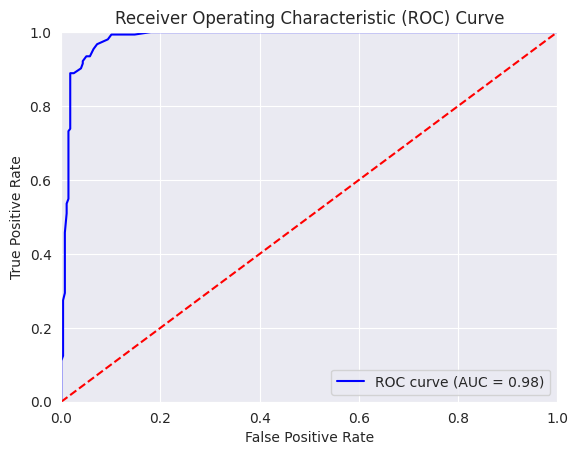

In [ ]:
# Plotting the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Random guess line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


model is structured to effectively learn from the data and provide insights into Alzheimer's disease diagnosis based on various health and lifestyle features, while also incorporating techniques to minimize overfittin

#Clustering Coefficent

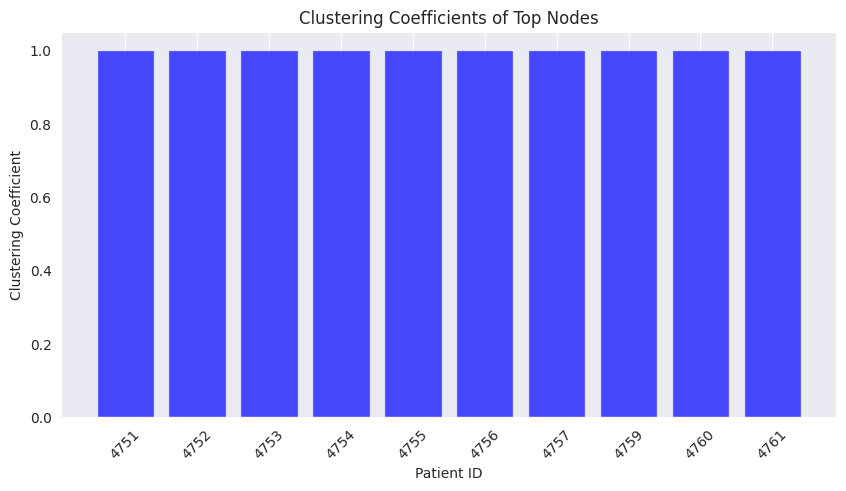

   PatientID  ClusteringCoefficient
0       4751                    1.0
1       4752                    1.0
2       4753                    1.0
3       4754                    1.0
4       4755                    1.0
5       4756                    1.0
6       4757                    1.0
7       4759                    1.0
8       4760                    1.0
9       4761                    1.0


In [ ]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# Create a graph
G = nx.Graph()

# Adding nodes (patients)
for patient in df['PatientID'].unique():
    G.add_node(patient)

# Adding edges based on interactions (same diagnosis)
for i, row in df.iterrows():
    patient1 = row['PatientID']
    for j in range(i + 1, len(df)):
        patient2 = df.iloc[j]['PatientID']
        if row['Diagnosis'] == df.iloc[j]['Diagnosis']:
            G.add_edge(patient1, patient2)

# Calculate clustering coefficients for all nodes
clustering_coeffs = nx.clustering(G)

# Add clustering coefficient as a node attribute
for node, coeff in clustering_coeffs.items():
    G.nodes[node]['clustering_coefficient'] = coeff

# Step 1: Identify top nodes based on degree (or any other criteria)
top_n = 10  # Change this to the number of top nodes you want
top_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)[:top_n]
top_node_ids = [node for node, _ in top_nodes]

# Step 2: Extract clustering coefficients for top nodes
top_coeffs = {node: clustering_coeffs[node] for node in top_node_ids}

# Convert top clustering coefficients to a DataFrame for analysis
top_coeff_df = pd.DataFrame(list(top_coeffs.items()), columns=['PatientID', 'ClusteringCoefficient'])

# Step 3: Visualize clustering coefficients for top nodes
plt.figure(figsize=(10, 5))
plt.bar(top_coeff_df['PatientID'].astype(str), top_coeff_df['ClusteringCoefficient'], color='blue', alpha=0.7)
plt.title('Clustering Coefficients of Top Nodes')
plt.xlabel('Patient ID')
plt.ylabel('Clustering Coefficient')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

# Print the clustering coefficients for reference
print(top_coeff_df)


clustering coefficient of 1.0 suggests that all patients in this dataset have a perfect clustering tendency. This means that if we consider patients as nodes in a network, they are all connected to each other, creating a tightly-knit group where every patient is a neighbor to every other patient.

Network Density: 0.5426


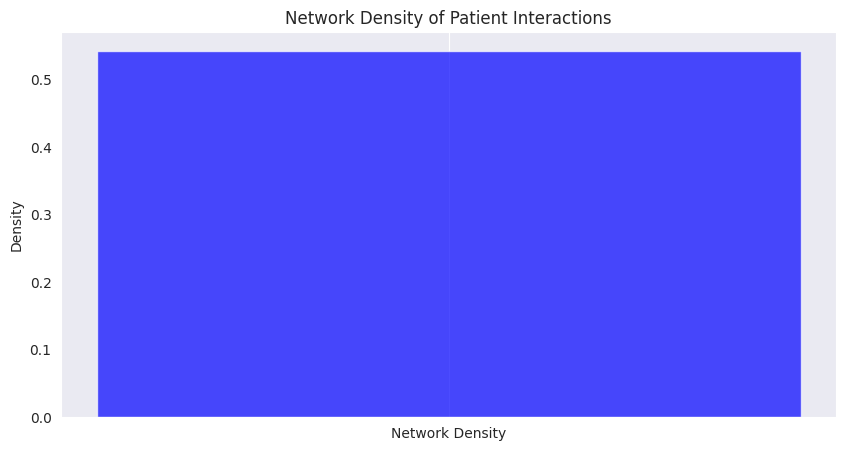

In [ ]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# Create a graph
G = nx.Graph()

# Adding nodes (patients)
for patient in df['PatientID'].unique():
    G.add_node(patient)

# Adding edges based on interactions (e.g., shared diagnosis)
for i, row in df.iterrows():
    patient1 = row['PatientID']
    for j in range(i + 1, len(df)):
        patient2 = df.iloc[j]['PatientID']
        if row['Diagnosis'] == df.iloc[j]['Diagnosis']:
            G.add_edge(patient1, patient2)

# Calculate network density
density = nx.density(G)

# Display the network density
print(f"Network Density: {density:.4f}")

# Optionally visualize the network density (without health outcomes)
plt.figure(figsize=(10, 5))
plt.bar(['Network Density'], [density], color='blue', alpha=0.7)
plt.title('Network Density of Patient Interactions')
plt.ylabel('Density')
plt.grid(axis='y')
plt.show()


The network density of 0.5426 indicates a moderately interconnected group of patients, which could have significant implications for understanding their interactions and the potential impact of these relationships on health outcomes

assortativity -  coefficient measures the tendency of nodes to connect to others with similar degrees.

 It allows for exploring relationships and interactions among patients, which could be relevant for analyzing health outcomes or social dynamics within the dataset.

Degree Assortativity Coefficient: 1.0000


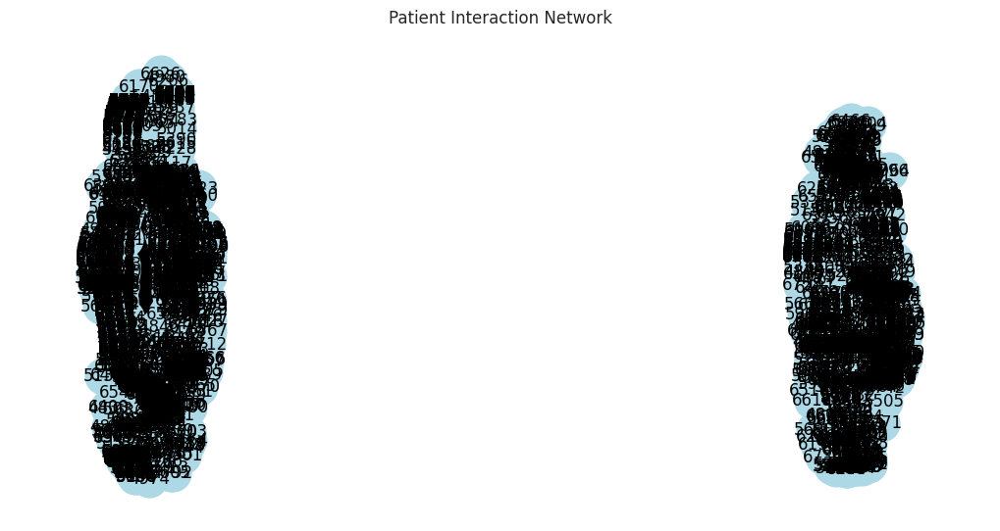

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt


G = nx.Graph()

# Adding nodes (patients)
for patient in df['PatientID'].unique():
    G.add_node(patient)

# Adding edges based on interactions (e.g., shared diagnosis)
for i, row in df.iterrows():
    patient1 = row['PatientID']
    for j in range(i + 1, len(df)):
        patient2 = df.iloc[j]['PatientID']
        if row['Diagnosis'] == df.iloc[j]['Diagnosis']:
            G.add_edge(patient1, patient2)

# Calculate the degree assortativity coefficient
assortativity = nx.degree_assortativity_coefficient(G)

# Display the assortativity
print(f"Degree Assortativity Coefficient: {assortativity:.4f}")

# Optional: Visualize the network structure
plt.figure(figsize=(10, 5))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_size=700, node_color='lightblue')
plt.title("Patient Interaction Network")
plt.show()


A degree assortativity coefficient of 1.0000 indicates a highly structured network of patient interactions, suggesting that the social dynamics within the group may play a significant role in their collective health experiences

In [ ]:
# Calculate network diameter
if nx.is_connected(G):
    diameter = nx.diameter(G)
    print(f"Network Diameter: {diameter}")
else:
    print("The network is not connected, so the diameter cannot be computed.")


The network is not connected, so the diameter cannot be computed.


In [ ]:
# Calculate average path length
if nx.is_connected(G):
    avg_path_length = nx.average_shortest_path_length(G)
    print(f"Average Path Length: {avg_path_length:.4f}")
else:
    print("The network is not connected, so the average path length cannot be computed.")


The network is not connected, so the average path length cannot be computed.


In [ ]:
from networkx.algorithms import community

# Detect communities using the greedy modularity algorithm
communities = community.greedy_modularity_communities(G)

# Display the number of communities found
print(f"Number of Communities Detected: {len(communities)}")


Number of Communities Detected: 2


In [ ]:
# Calculate the number of connected components
connected_components = list(nx.connected_components(G))
num_connected_components = len(connected_components)

print(f"Number of Connected Components: {num_connected_components}")


Number of Connected Components: 2


In [ ]:
# Calculate HITS scores
hubs, authorities = nx.hits(G)

# Display top hubs
top_hubs = sorted(hubs.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top Hubs:")
for hub in top_hubs:
    print(f"PatientID: {hub[0]}, Hub Score: {hub[1]:.4f}")


Top Hubs:
PatientID: 4751, Hub Score: 0.0007
PatientID: 4752, Hub Score: 0.0007
PatientID: 4753, Hub Score: 0.0007
PatientID: 4754, Hub Score: 0.0007
PatientID: 4755, Hub Score: 0.0007
PatientID: 4756, Hub Score: 0.0007
PatientID: 4757, Hub Score: 0.0007
PatientID: 4759, Hub Score: 0.0007
PatientID: 4760, Hub Score: 0.0007
PatientID: 4761, Hub Score: 0.0007


 This uniformity might suggest that the structure of connections around these patients is somewhat balanced in terms of influence or role in the network.

In [ ]:
# Calculate PageRank
pagerank = nx.pagerank(G)

# Display top nodes with high PageRank
top_pagerank = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top Nodes by PageRank:")
for node in top_pagerank:
    print(f"PatientID: {node[0]}, PageRank: {node[1]:.4f}")


Top Nodes by PageRank:
PatientID: 4751, PageRank: 0.0005
PatientID: 4752, PageRank: 0.0005
PatientID: 4753, PageRank: 0.0005
PatientID: 4754, PageRank: 0.0005
PatientID: 4755, PageRank: 0.0005
PatientID: 4756, PageRank: 0.0005
PatientID: 4757, PageRank: 0.0005
PatientID: 4759, PageRank: 0.0005
PatientID: 4760, PageRank: 0.0005
PatientID: 4761, PageRank: 0.0005


The fact that multiple patients share the same PageRank score (0.0010) indicates that they have similar levels of importance or influence within the network, at least according to the PageRank metric.


                                                                         END